In [91]:
%config InlineBackend.figure_format = 'retina'


In [120]:
import pandas as pd
import numpy as np
import pickle
import importlib.machinery
import os
import scipy.stats as ss
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import decomposition, manifold
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, plot_confusion_matrix
import sklearn.metrics as le_me
from itertools import permutations
from tqdm import tqdm
import networkx as nx
import scipy.stats as stats
from sklearn.preprocessing import StandardScaler
import warnings


from scipy.stats import entropy
warnings.filterwarnings('ignore', category=UserWarning)


# Import your custom functions
functions = importlib.machinery.SourceFileLoader('module_name', './custom_functions.py').load_module()


data shape: (1363, 15133)


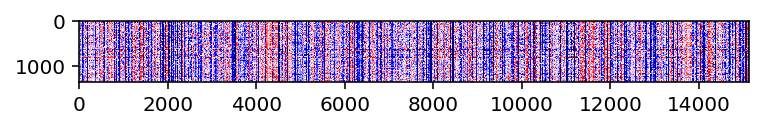

In [93]:
# merge and load data
GSE96058 = functions.merge_load_csv('./data/GSE96058')
plt.imshow(GSE96058, cmap='seismic', interpolation='nearest')

x_train shape: (1090, 15132)    y_train shape: (1090,)
x_test shape : (273, 15132)    y_test shape: (273,)


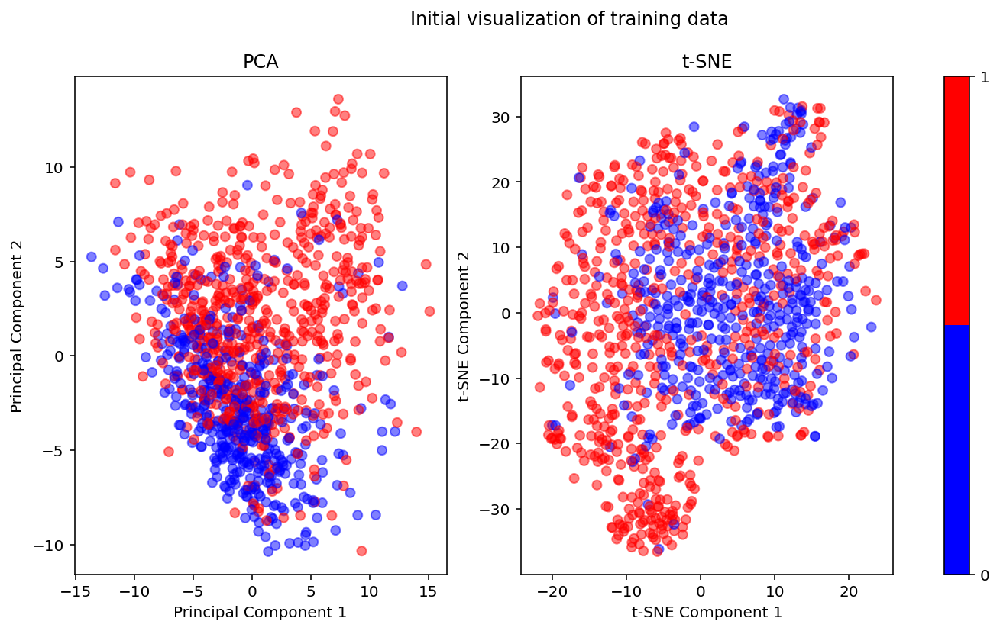

--- kernel pca ---


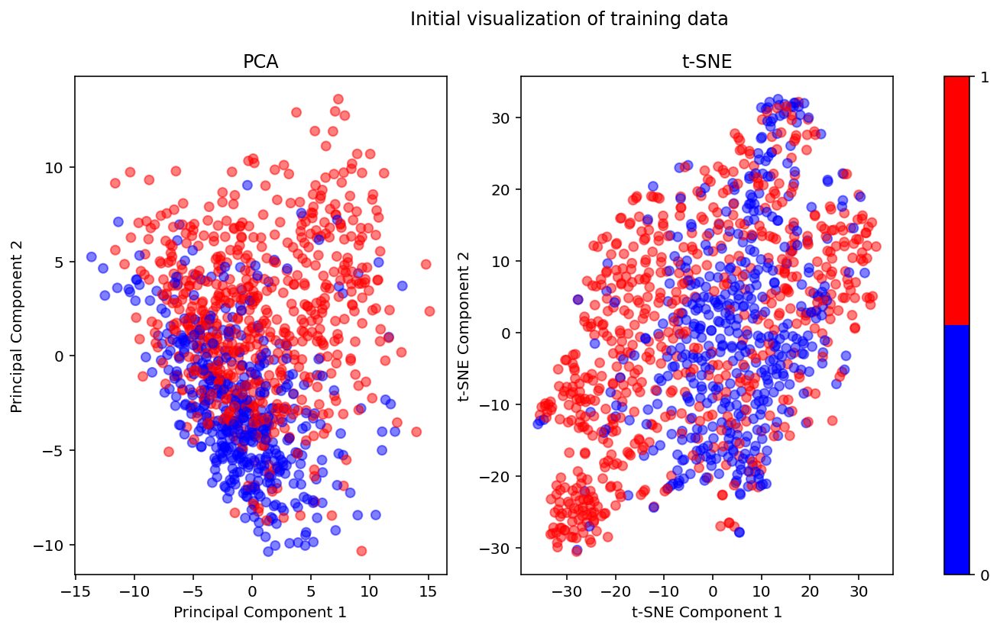

In [94]:
# split train and test
x_train, x_test, y_train, y_test = functions.train_test_splitting(GSE96058)
functions.visualize_training_data(x_train, y_train)

# get pc reduction
k = 100
# 'PCA', 'FA', 'LDA', 'SVD', 'KernelPCA', 'SparsePCA', 'Isomap', 'ICA', 'NMF'
print("--- kernel pca ---")
x_train_reduced, x_test_reduced, kernelpca_reducer = functions.apply_dimensionality_reduction(x_train, x_test, 'KernelPCA', k)
functions.visualize_training_data(x_train_reduced, y_train)


In [95]:
# load importances
mlp_importances = functions.fetch_importances(GSE96058, './results/feature_importance/mlp_model')
cnn_importances = functions.fetch_importances(GSE96058, './results/feature_importance/cnn_model')
log_importances = functions.fetch_importances(GSE96058, './results/feature_importance/log_model')

# load models
mlp_model = functions.load_keras_model('./results/models/mlp_model.h5')
cnn_model = functions.load_keras_model('./results/models/cnn_model.h5')
log_model = functions.load_keras_model('./results/models/log_model.h5')

In [96]:
# show top 20 avg ranked genes
rank_df = functions.average_rank([cnn_importances, mlp_importances, log_importances], ['cnn', 'mlp', 'log'])
rank_df.head(20)

,cnn,mlp,log,avg_importance
MKI67,0.958387,0.991642,0.998357,0.982795
ESPL1,0.941615,0.987109,0.987565,0.972096
CASP14,0.967848,0.970810,0.968485,0.969047
KIF11,0.917527,0.993948,0.990263,0.967246
PKMYT1,0.894444,0.984587,0.991103,0.956711
POLQ,0.980583,0.978924,0.898973,0.952827
TROAP,0.956657,0.902466,0.996039,0.951721
NCAPH,0.910679,0.947958,0.995285,0.951308
TP53TG5,0.895216,0.971969,0.982295,0.949827
CAMK2B,0.849036,0.989568,0.986785,0.941796


In [97]:
# Concatenate the dataframes
GSE96058_test = pd.concat([y_test, x_test], axis=1)

# Flatten tuple column names
GSE96058_test.columns = [col[0] if isinstance(col, tuple) else col for col in GSE96058_test.columns]
GSE96058_test

,output,SAMD11.rescaled,NOC2L.rescaled,KLHL17.rescaled,PLEKHN1.rescaled,HES4.rescaled,ISG15.rescaled,AGRN.rescaled,RNF223.rescaled,C1orf159.rescaled,...,BRCC3.rescaled,VBP1.rescaled,RAB39B.rescaled,CLIC2.rescaled,F8A3.rescaled,TMLHE.rescaled,SPRY3.rescaled,VAMP7.rescaled,IL9R.rescaled,ZFY.rescaled
sampleID,,,,,,,,,,,,,,,,,,,,,
F2494,1,0.314669,0.460408,0.431441,0.471731,0.529115,0.458994,0.635908,0.581745,0.246883,...,0.362019,0.463688,0.649393,0.194093,0.569544,0.651998,0.260692,0.397635,0.247530,0.000000
F3002,0,0.241697,0.310909,0.606935,0.420705,0.508138,0.225531,0.578107,0.278953,0.411393,...,0.238947,0.288737,0.232615,0.573839,0.584094,0.556720,0.457180,0.512378,0.532393,0.109162
F3260,0,0.407778,0.437848,0.520646,0.668873,0.645955,0.361722,0.568854,0.563899,0.453418,...,0.470599,0.422494,0.210388,0.511087,0.682380,0.725394,0.480562,0.614617,0.396767,0.051910
F1881,0,0.725527,0.433929,0.485816,0.768089,0.688101,0.330800,0.790417,0.434346,0.342788,...,0.280203,0.330548,0.192898,0.470509,0.712714,0.662416,0.465155,0.571506,0.370629,0.045302
F3083,0,0.471170,0.457272,0.606435,0.614451,0.538784,0.227101,0.602796,0.489235,0.417512,...,0.412799,0.541079,0.319357,0.411577,0.645127,0.713674,0.400254,0.582883,0.396942,0.185736
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F2615,1,0.184848,0.202400,0.424147,0.426088,0.606783,0.610439,0.386072,0.555744,0.198160,...,0.438097,0.537704,0.057324,0.449532,0.537646,0.774718,0.247955,0.621110,0.409924,0.092215
F460,1,0.647358,0.811284,0.692567,0.857344,0.337224,0.432348,0.854466,0.058472,0.644983,...,0.433376,0.468691,0.405482,0.627420,0.708519,0.708920,0.391115,0.602673,0.589695,0.068073
F3028,1,0.590354,0.405781,0.544648,0.675545,0.544973,0.365960,0.616714,0.326781,0.354286,...,0.256740,0.385306,0.502375,0.727201,0.726707,0.618955,0.668210,0.578739,0.675589,0.046067


In [98]:
# # Compute the average change in model predictions caused by permuting each top feature.
# log_avg_changes_df = functions.compute_avg_prediction_change(GSE96058_test, log_importances, 100, 
#                                                    100, log_model, kernelpca_reducer)
# mlp_avg_changes_df = functions.compute_avg_prediction_change(GSE96058_test, mlp_importances, 100, 
#                                                    100, mlp_model, kernelpca_reducer)
# cnn_avg_changes_df = functions.compute_avg_prediction_change(GSE96058_test, cnn_importances, 100, 
#                                                    100, cnn_model, kernelpca_reducer)

# # Save results
# functions.save_dataframe(log_avg_changes_df, "./results/prediction_changes", 'log_GSE96058_prediction_space')
# functions.save_dataframe(mlp_avg_changes_df, "./results/prediction_changes", 'mlp_GSE96058_prediction_space')
# functions.save_dataframe(cnn_avg_changes_df, "./results/prediction_changes", 'cnn_GSE96058_prediction_space')

In [99]:
# Load avg change results
log_avg_changes_df = functions.load_dataframe("./results/prediction_changes", "log_GSE96058_prediction_space")
mlp_avg_changes_df = functions.load_dataframe("./results/prediction_changes", "mlp_GSE96058_prediction_space")
cnn_avg_changes_df = functions.load_dataframe("./results/prediction_changes", "cnn_GSE96058_prediction_space")

In [100]:
# compute gene correlation (similarity of avg change across all patients)
log_gene_correlations = functions.compute_gene_correlations(log_avg_changes_df)
mlp_gene_correlations = functions.compute_gene_correlations(mlp_avg_changes_df)
cnn_gene_correlations = functions.compute_gene_correlations(cnn_avg_changes_df)


data shape: (405, 15133)


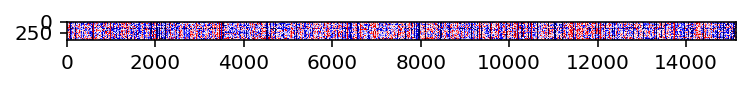

In [101]:
# merge and load data train test split
GSE81538 = functions.merge_load_csv('./data/GSE81538')
plt.imshow(GSE81538, cmap='seismic', interpolation='nearest')


In [102]:
# data formating
X_GSE81538 = GSE81538.copy()
X_GSE81538.columns = [col[0] for col in X_GSE81538.columns] 
y_GSE81538 = X_GSE81538['output']
X_GSE81538 = X_GSE81538.drop(X_GSE81538.columns[0], axis=1)
X_GSE81538 = kernelpca_reducer.transform(X_GSE81538)

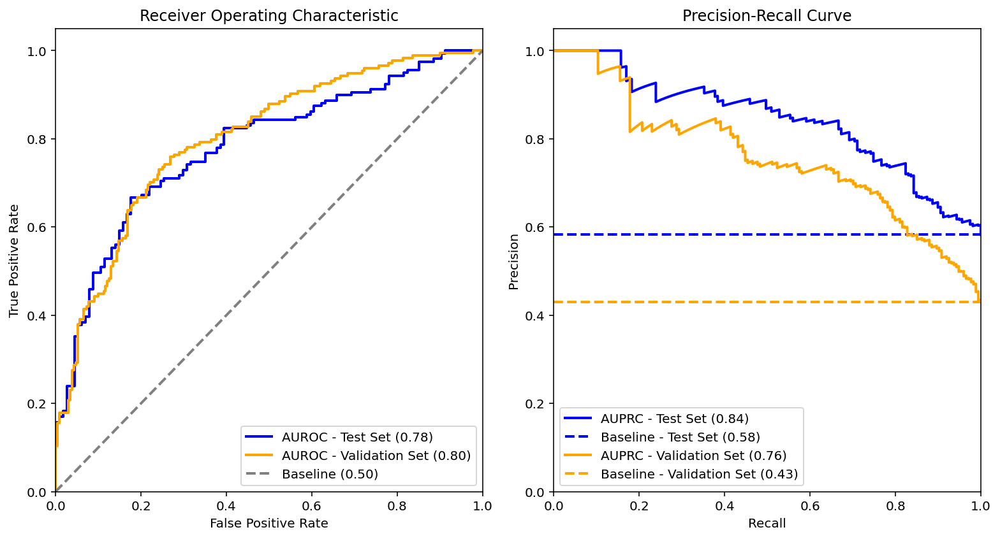

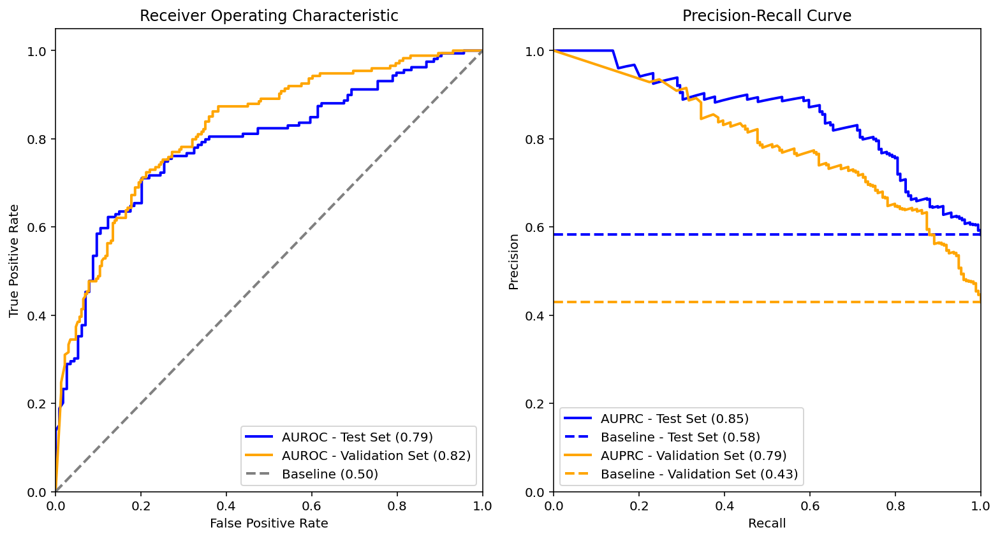

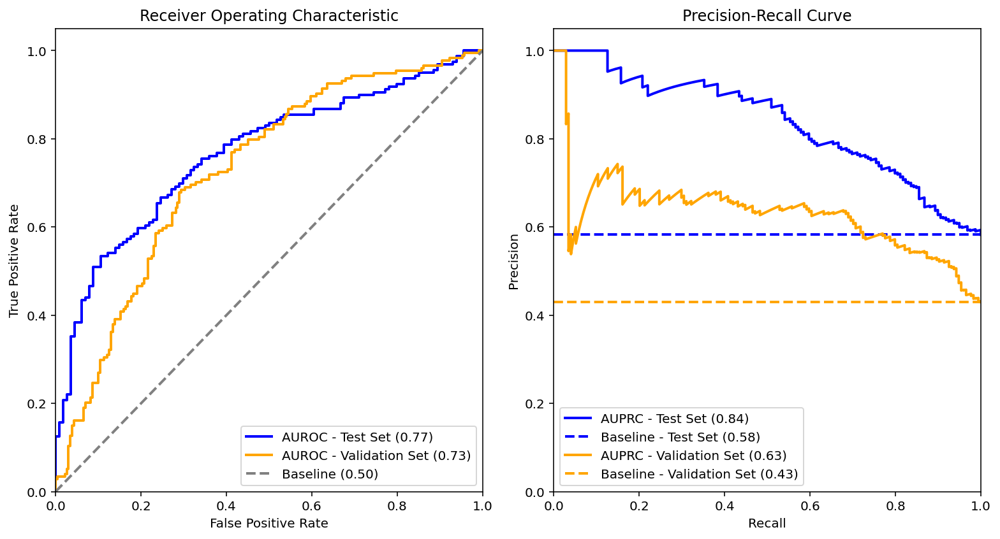

In [103]:

functions.model_evaluation_duo(log_model, x_test_reduced,y_test, X_GSE81538, y_GSE81538)  
functions.model_evaluation_duo(mlp_model, x_test_reduced,y_test, X_GSE81538, y_GSE81538)  
functions.model_evaluation_duo(cnn_model, x_test_reduced,y_test, X_GSE81538, y_GSE81538)  



In [104]:
x_test

,SAMD11.rescaled,NOC2L.rescaled,KLHL17.rescaled,PLEKHN1.rescaled,HES4.rescaled,ISG15.rescaled,AGRN.rescaled,RNF223.rescaled,C1orf159.rescaled,TTLL10.rescaled,...,BRCC3.rescaled,VBP1.rescaled,RAB39B.rescaled,CLIC2.rescaled,F8A3.rescaled,TMLHE.rescaled,SPRY3.rescaled,VAMP7.rescaled,IL9R.rescaled,ZFY.rescaled
sampleID,,,,,,,,,,,,,,,,,,,,,
F2494,0.314669,0.460408,0.431441,0.471731,0.529115,0.458994,0.635908,0.581745,0.246883,0.175829,...,0.362019,0.463688,0.649393,0.194093,0.569544,0.651998,0.260692,0.397635,0.247530,0.000000
F3002,0.241697,0.310909,0.606935,0.420705,0.508138,0.225531,0.578107,0.278953,0.411393,0.225304,...,0.238947,0.288737,0.232615,0.573839,0.584094,0.556720,0.457180,0.512378,0.532393,0.109162
F3260,0.407778,0.437848,0.520646,0.668873,0.645955,0.361722,0.568854,0.563899,0.453418,0.171000,...,0.470599,0.422494,0.210388,0.511087,0.682380,0.725394,0.480562,0.614617,0.396767,0.051910
F1881,0.725527,0.433929,0.485816,0.768089,0.688101,0.330800,0.790417,0.434346,0.342788,0.217888,...,0.280203,0.330548,0.192898,0.470509,0.712714,0.662416,0.465155,0.571506,0.370629,0.045302
F3083,0.471170,0.457272,0.606435,0.614451,0.538784,0.227101,0.602796,0.489235,0.417512,0.147158,...,0.412799,0.541079,0.319357,0.411577,0.645127,0.713674,0.400254,0.582883,0.396942,0.185736
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F2615,0.184848,0.202400,0.424147,0.426088,0.606783,0.610439,0.386072,0.555744,0.198160,0.082555,...,0.438097,0.537704,0.057324,0.449532,0.537646,0.774718,0.247955,0.621110,0.409924,0.092215
F460,0.647358,0.811284,0.692567,0.857344,0.337224,0.432348,0.854466,0.058472,0.644983,0.310778,...,0.433376,0.468691,0.405482,0.627420,0.708519,0.708920,0.391115,0.602673,0.589695,0.068073
F3028,0.590354,0.405781,0.544648,0.675545,0.544973,0.365960,0.616714,0.326781,0.354286,0.259653,...,0.256740,0.385306,0.502375,0.727201,0.726707,0.618955,0.668210,0.578739,0.675589,0.046067


In [105]:
# log_avg_changes_df_GSE81538 = functions.compute_avg_prediction_change(GSE81538, log_importances, 100, 
#                                                             100, log_model, kernelpca_reducer)
# mlp_avg_changes_df_GSE81538 = functions.compute_avg_prediction_change(GSE81538, mlp_importances, 100, 
#                                                             100, mlp_model, kernelpca_reducer)
# cnn_avg_changes_df_GSE81538 = functions.compute_avg_prediction_change(GSE81538, cnn_importances, 100, 
#                                                             100, cnn_model, kernelpca_reducer)

# functions.save_dataframe(log_avg_changes_df_GSE81538, "./results/prediction_changes", 'log_GSE81538_prediction_space')
# functions.save_dataframe(mlp_avg_changes_df_GSE81538, "./results/prediction_changes", 'mlp_GSE81538_prediction_space')
# functions.save_dataframe(cnn_avg_changes_df_GSE81538, "./results/prediction_changes", 'cnn_GSE81538_prediction_space')


In [106]:
log_avg_changes_df_GSE81538 = functions.load_dataframe("./results/prediction_changes", "log_GSE81538_prediction_space")
mlp_avg_changes_df_GSE81538 = functions.load_dataframe("./results/prediction_changes", "mlp_GSE81538_prediction_space")
cnn_avg_changes_df_GSE81538 = functions.load_dataframe("./results/prediction_changes", "cnn_GSE81538_prediction_space")


In [107]:
mlp_gene_correlations_GSE81538 = functions.compute_gene_correlations(mlp_avg_changes_df_GSE81538)
cnn_gene_correlations_GSE81538 = functions.compute_gene_correlations(cnn_avg_changes_df_GSE81538)
log_gene_correlations_GSE81538 = functions.compute_gene_correlations(log_avg_changes_df_GSE81538)


In [108]:
log_corr = functions.combine_gene_correlations(log_gene_correlations, log_gene_correlations_GSE81538, 
                                     len(GSE96058_test.index), len(GSE81538.index))
mlp_corr = functions.combine_gene_correlations(mlp_gene_correlations, mlp_gene_correlations_GSE81538, 
                                     len(GSE96058_test.index), len(GSE81538.index))
cnn_corr = functions.combine_gene_correlations(cnn_gene_correlations, cnn_gene_correlations_GSE81538, 
                                     len(GSE96058_test.index), len(GSE81538.index))


Trying kmeans parameters: 144it [03:40,  1.53s/it]
Trying agglomerative parameters: 120it [00:48,  2.45it/s]
Trying spectral parameters: 36it [01:21,  2.26s/it]
Trying gmm parameters: 24it [00:33,  1.38s/it]
Trying affinity_propagation parameters: 100it [00:31,  3.22it/s]
Trying optics parameters: 270it [18:56,  4.21s/it]


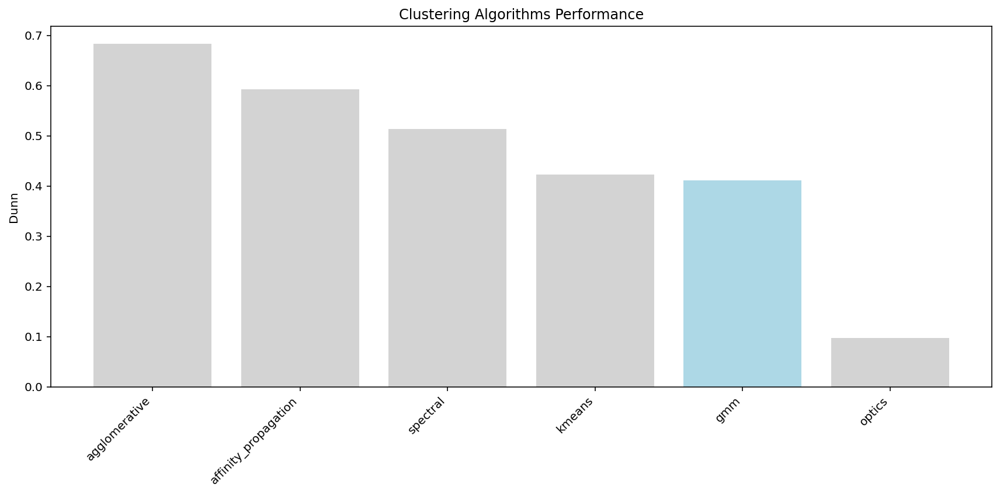

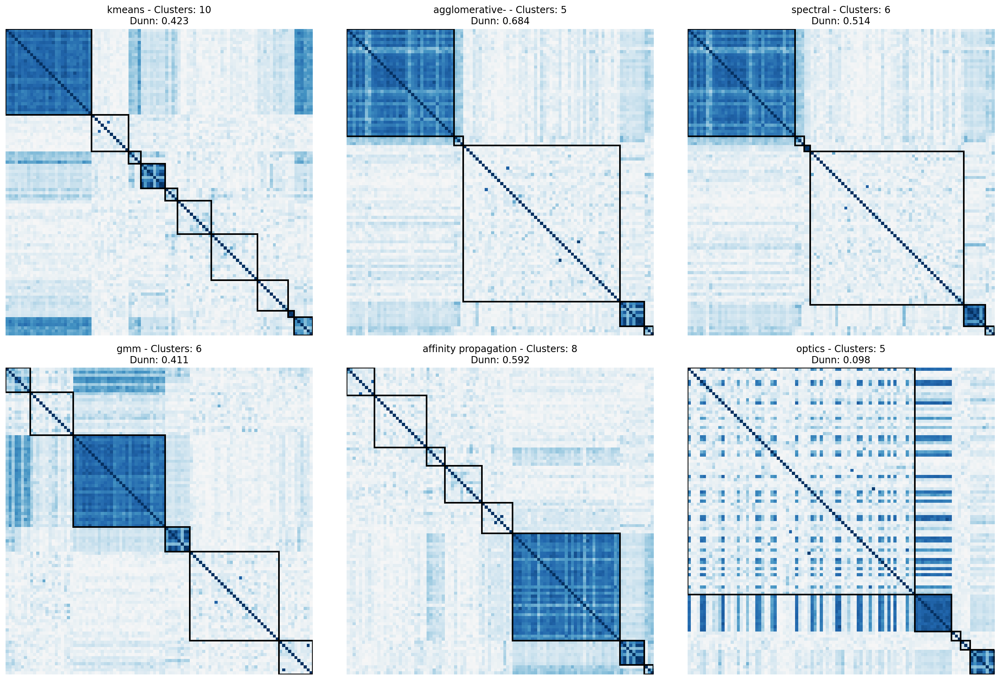

Trying kmeans parameters: 144it [03:57,  1.65s/it]
Trying agglomerative parameters: 120it [00:48,  2.49it/s]
Trying spectral parameters: 36it [01:26,  2.39s/it]
Trying gmm parameters: 24it [00:34,  1.45s/it]
Trying affinity_propagation parameters: 100it [00:34,  2.91it/s]
Trying optics parameters: 270it [19:18,  4.29s/it]


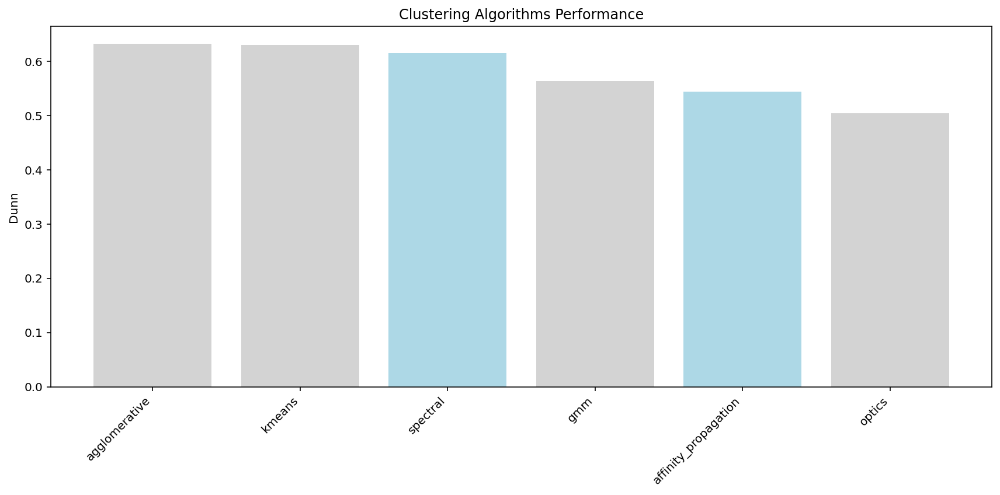

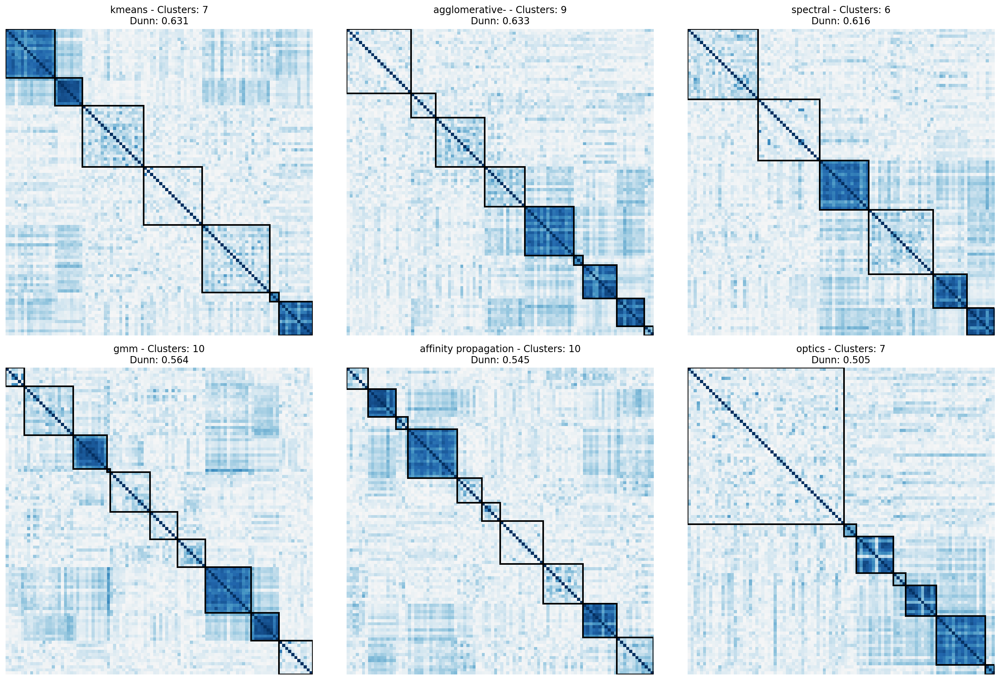

Trying kmeans parameters: 144it [04:09,  1.73s/it]
Trying agglomerative parameters: 120it [00:47,  2.54it/s]
Trying spectral parameters: 36it [01:38,  2.73s/it]
Trying gmm parameters: 24it [00:37,  1.55s/it]
Trying affinity_propagation parameters: 100it [01:31,  1.09it/s]
Trying optics parameters: 270it [19:55,  4.43s/it]


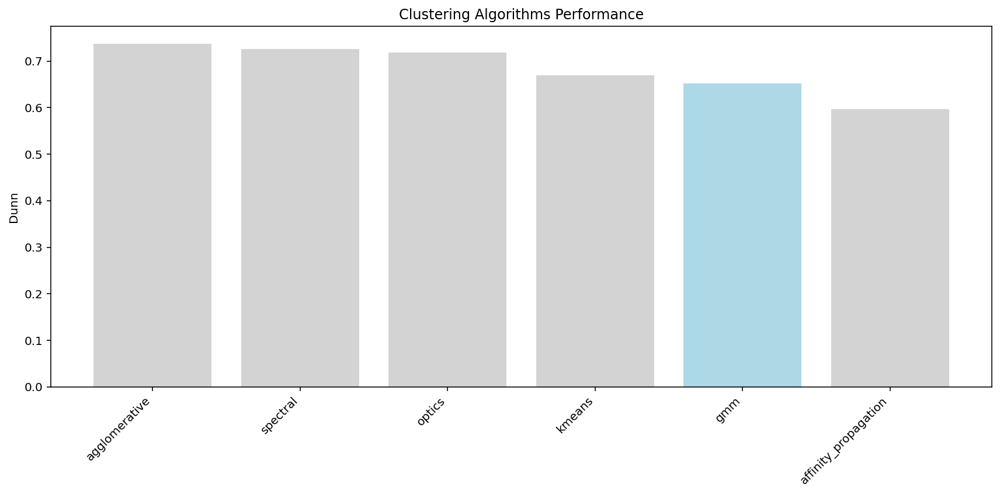

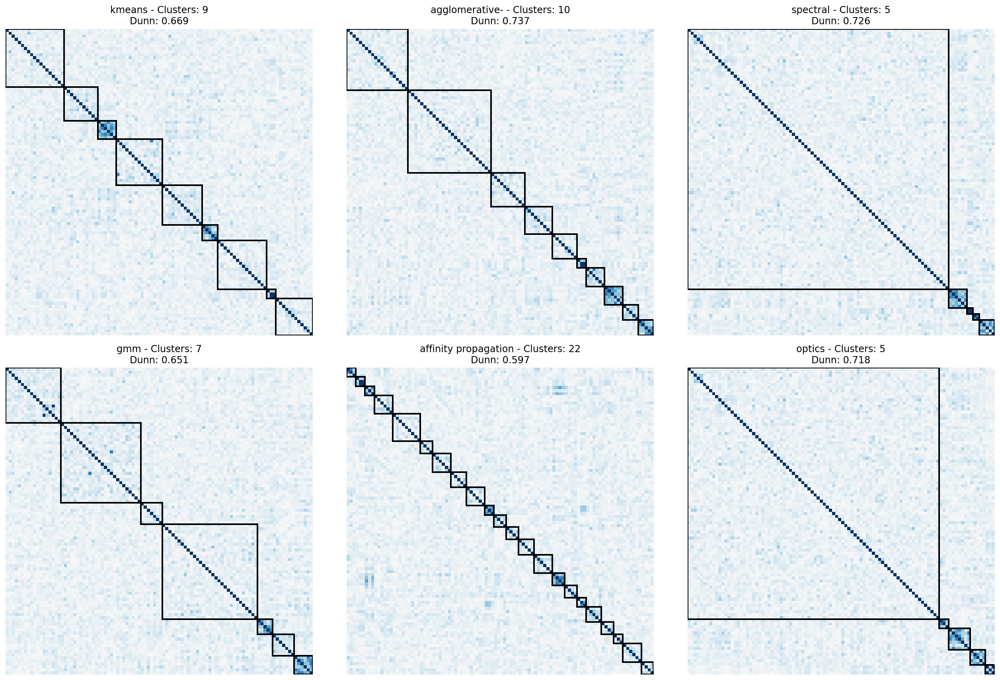

In [123]:

# Compare different clustering algorithms and return the one with the best performance based on the selected scoring metric.
    
# # method options 'kmeans', 'agglomerative', 'spectral', 'gmm', 'affinity_propagation', 'dbscan', 'optics'
methods = ['kmeans', 'agglomerative', 'spectral', 'gmm', 'affinity_propagation', 'optics']
# # scoring options 'silhouette', 'davies', 'calinski' 'dunn'
log_best_params = functions.compare_clustering_methods(log_corr.abs(), methods, min_clusters=5, max_clusters=10, 
                                             scoring_type='dunn', simulations=50)

mlp_best_params = functions.compare_clustering_methods(mlp_corr.abs(), methods, min_clusters=5, max_clusters=10, 
                                             scoring_type='dunn', simulations = 50)

cnn_best_params = functions.compare_clustering_methods(cnn_corr.abs(), methods, min_clusters=5, max_clusters=10, 
                                             scoring_type='dunn', simulations = 50)



In [124]:
# functions.save_data(log_corr, './results/clustering/log/corr_dat')
# functions.save_data(log_importances, './results/clustering/log/importances')
# functions.save_data(log_best_params, './results/clustering/log/best_params')

# functions.save_data(mlp_corr, './results/clustering/mlp/corr_dat')
# functions.save_data(mlp_importances, './results/clustering/mlp/importances')
# functions.save_data(mlp_best_params, './results/clustering/mlp/best_params')

# functions.save_data(cnn_corr, './results/clustering/cnn/corr_dat')
# functions.save_data(cnn_importances, './results/clustering/cnn/importances')
# functions.save_data(cnn_best_params, './results/clustering/cnn/best_params')



In [125]:
log_corr = functions.load_data('./results/clustering/log/corr_dat.csv')
log_importances = functions.load_data('./results/clustering/log/importances.csv')
log_best_params = functions.load_data('./results/clustering/log/best_params.txt')

mlp_corr = functions.load_data('./results/clustering/mlp/corr_dat.csv')
mlp_importances = functions.load_data('./results/clustering/mlp/importances.csv')
mlp_best_params = functions.load_data('./results/clustering/mlp/best_params.txt')

cnn_corr = functions.load_data('./results/clustering/cnn/corr_dat.csv')
cnn_importances = functions.load_data('./results/clustering/cnn/importances.csv')
cnn_best_params = functions.load_data('./results/clustering/cnn/best_params.txt')

100%|██████████████████████████████████████| 1000/1000 [00:05<00:00, 173.93it/s]


Recommended number of clusters: 5


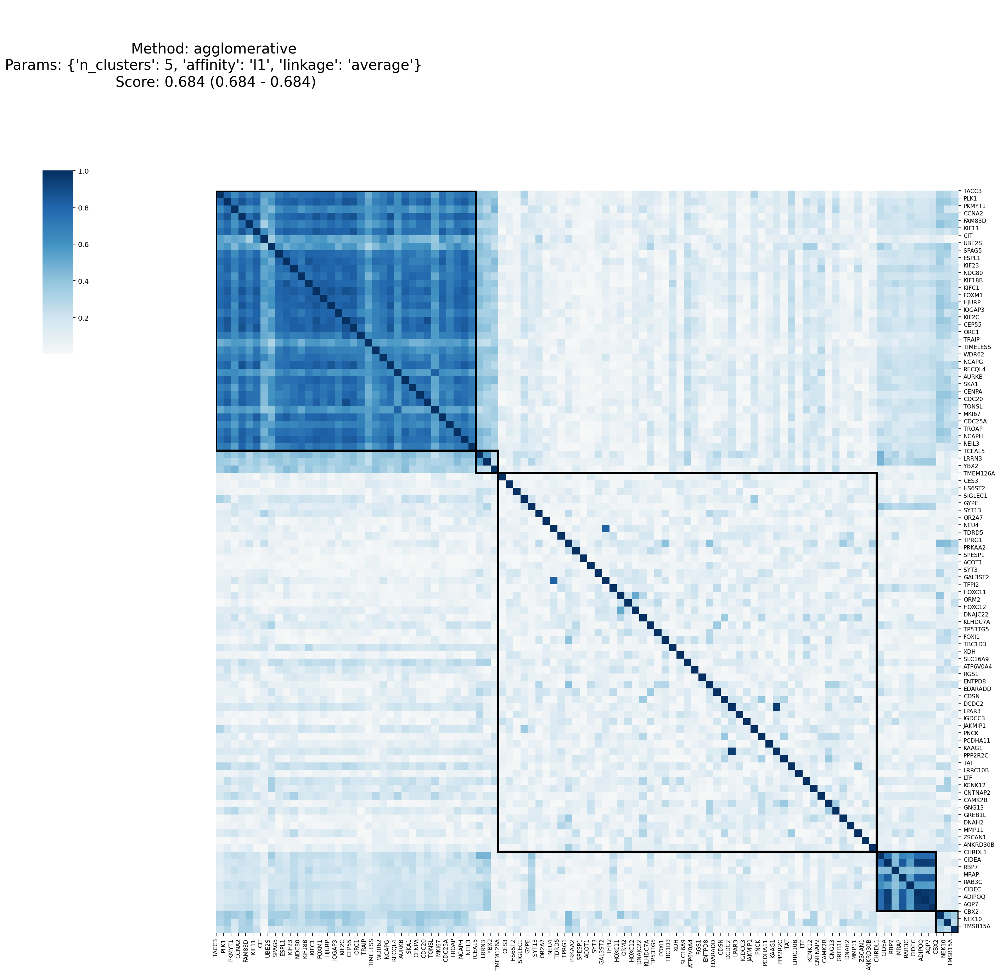

In [126]:
# 'silhouette', 'davies', 'calinski', 'dunn'
# 'kmeans', 'agglomerative', 'spectral', 'gmm', 'affinity_propagation', 'dbscan', 'optics'

# Runs clustering using the best parameters and plots the results.
log_clusters_kmeans, log_link_mat_kmeans, log_gene_order, log_cluster_order = functions.run_and_plot_best_clustering(log_corr.abs(), 
                                                                        log_best_params, 
                                                                        n_sims=1000, 
                                                                        scoring_type='dunn', 
                                                                        force_method = None, 
                                                                        save_location_name = 'corrplot_log')


100%|███████████████████████████████████████| 1000/1000 [00:11<00:00, 85.58it/s]


Recommended number of clusters: 9


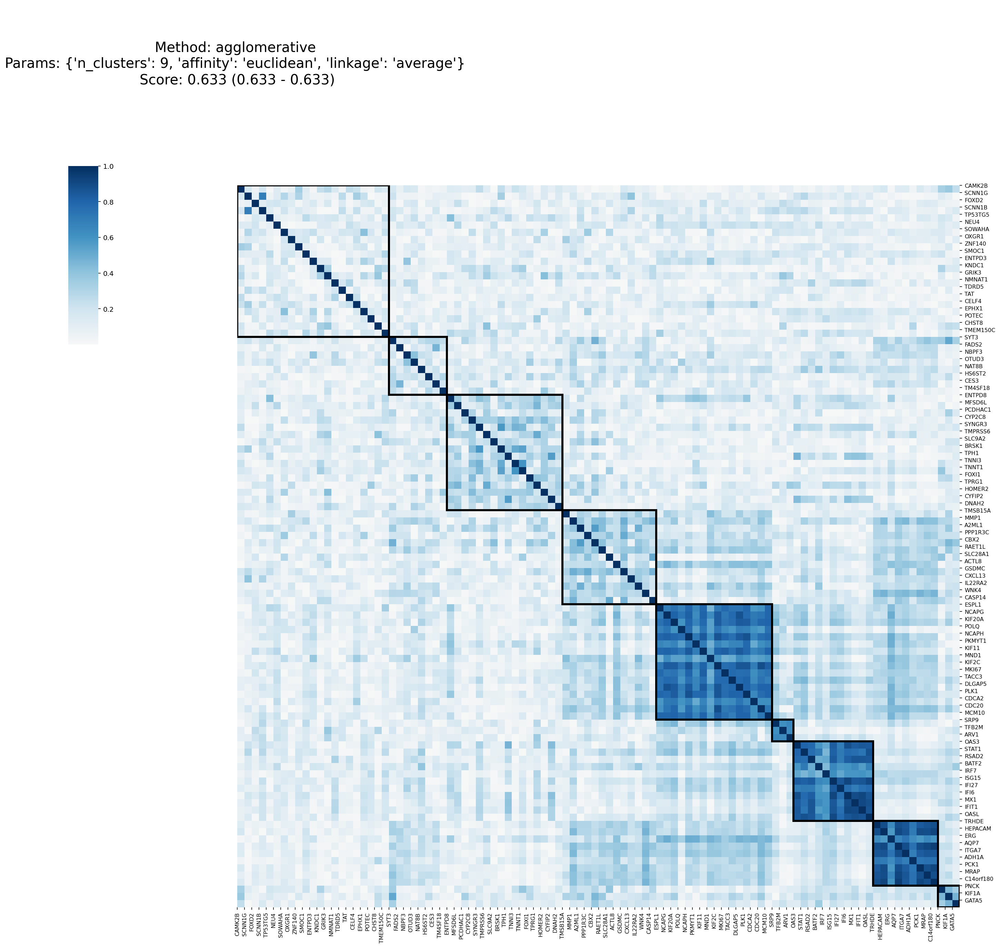

In [127]:

mlp_clusters_kmeans, mlp_link_mat_kmeans, mlp_gene_order, mlp_cluster_order = functions.run_and_plot_best_clustering(mlp_corr.abs(), 
                                                                        mlp_best_params, 
                                                                        n_sims=1000, 
                                                                        scoring_type='dunn', 
                                                                        force_method = None, 
                                                                        save_location_name = 'corrplot_mlp')


100%|███████████████████████████████████████| 1000/1000 [00:14<00:00, 70.91it/s]


Recommended number of clusters: 10


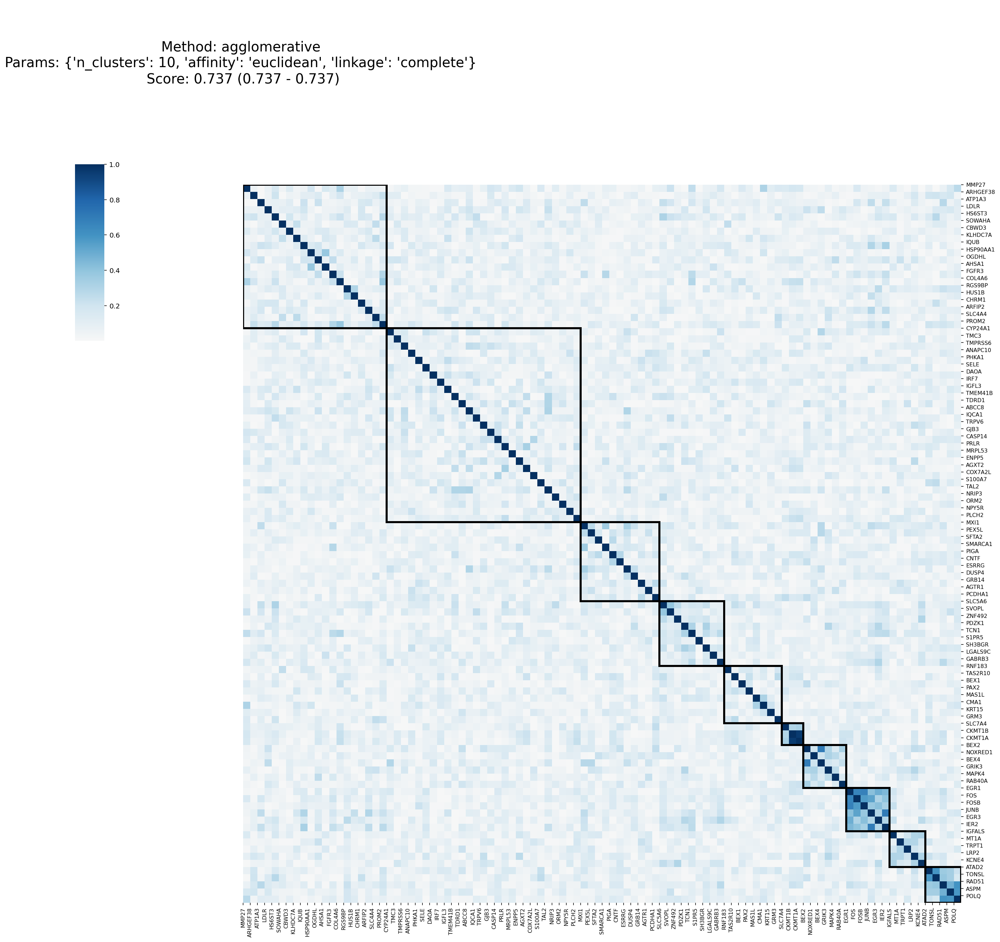

In [128]:
cnn_clusters_spectral, cnn_link_mat_spectral, cnn_gene_order, cnn_cluster_order = functions.run_and_plot_best_clustering(cnn_corr.abs(), 
                                                                        cnn_best_params, 
                                                                        n_sims=1000, 
                                                                        scoring_type='dunn', 
                                                                        force_method = None, 
                                                                        save_location_name = 'corrplot_cnn')


In [129]:
# functions.save_data(log_clusters_kmeans, './results/clustering/log/clusters')
# functions.save_data(log_link_mat_kmeans, './results/clustering/log/link_mat')

# functions.save_data(mlp_clusters_kmeans, './results/clustering/mlp/clusters')
# functions.save_data(mlp_link_mat_kmeans, './results/clustering/mlp/link_mat')

# functions.save_data(cnn_clusters_spectral, './results/clustering/cnn/clusters')
# functions.save_data(cnn_link_mat_spectral, './results/clustering/cnn/link_mat')


In [130]:
log_clusters_kmeans = functions.load_data('./results/clustering/log/clusters.npy')
log_link_mat_kmeans = functions.load_data('./results/clustering/log/link_mat.npy')

mlp_clusters_kmeans = functions.load_data('./results/clustering/mlp/clusters.npy')
mlp_link_mat_kmeans = functions.load_data('./results/clustering/mlp/link_mat.npy')

cnn_clusters_kmeans = functions.load_data('./results/clustering/cnn/clusters.npy')
cnn_link_mat_kmeans = functions.load_data('./results/clustering/cnn/link_mat.npy')

Saved: ./results/plots/log_cluster_1_AvgSimilarity_0.692.png


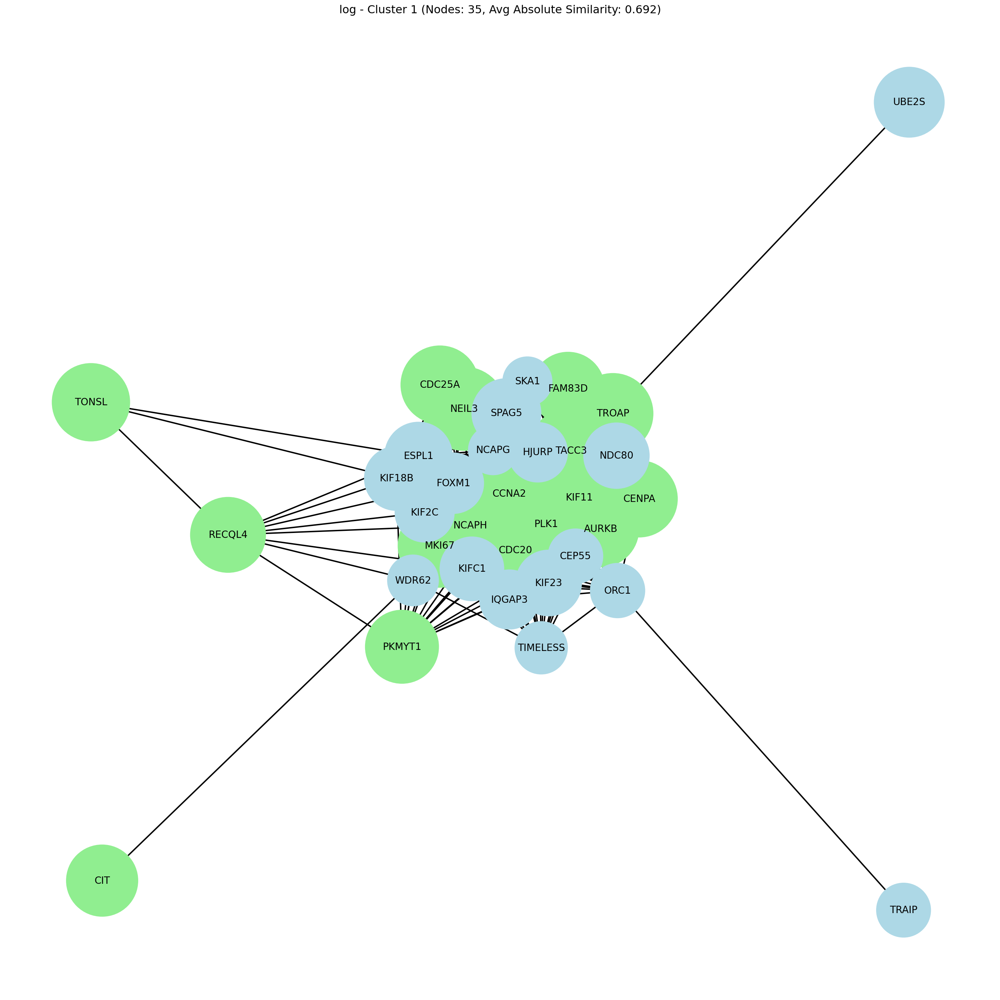

Saved: ./results/plots/log_cluster_4_AvgSimilarity_0.684.png


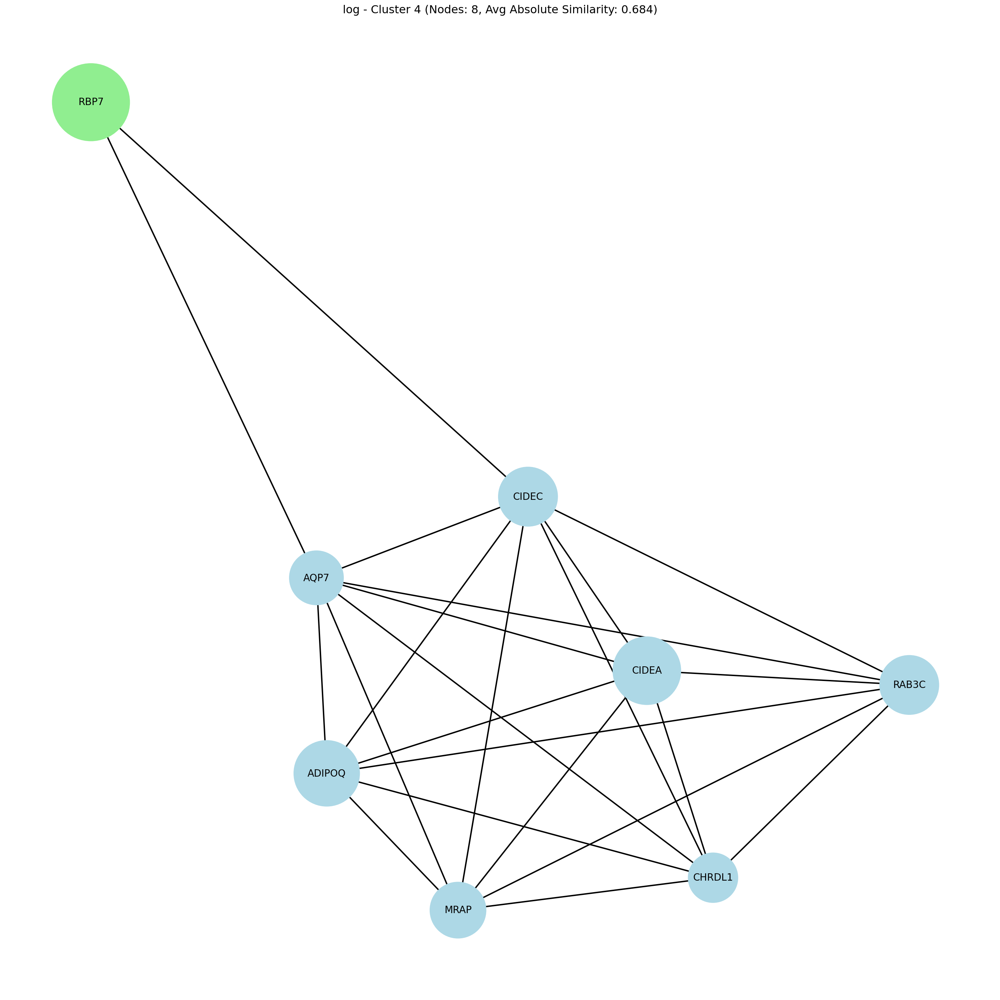

Saved: ./results/plots/log_cluster_2_AvgSimilarity_0.353.png


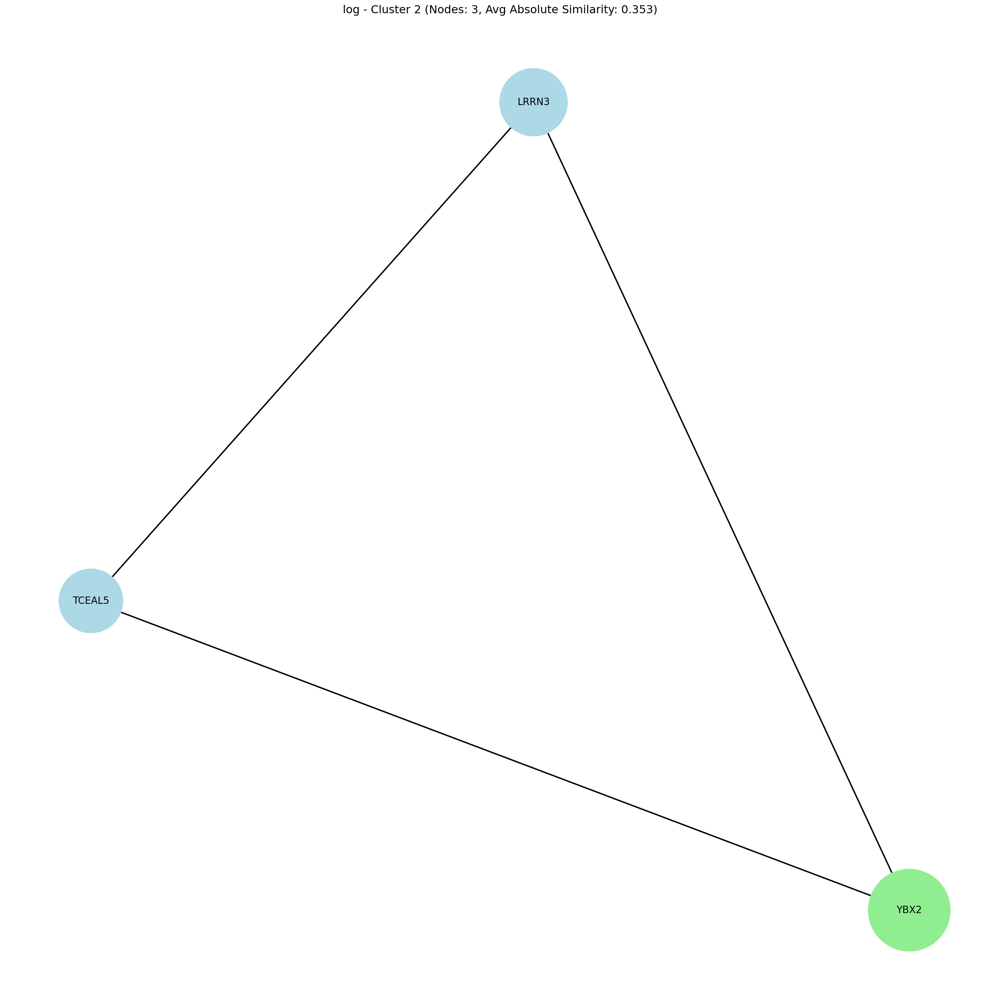

Saved: ./results/plots/log_cluster_5_AvgSimilarity_0.348.png


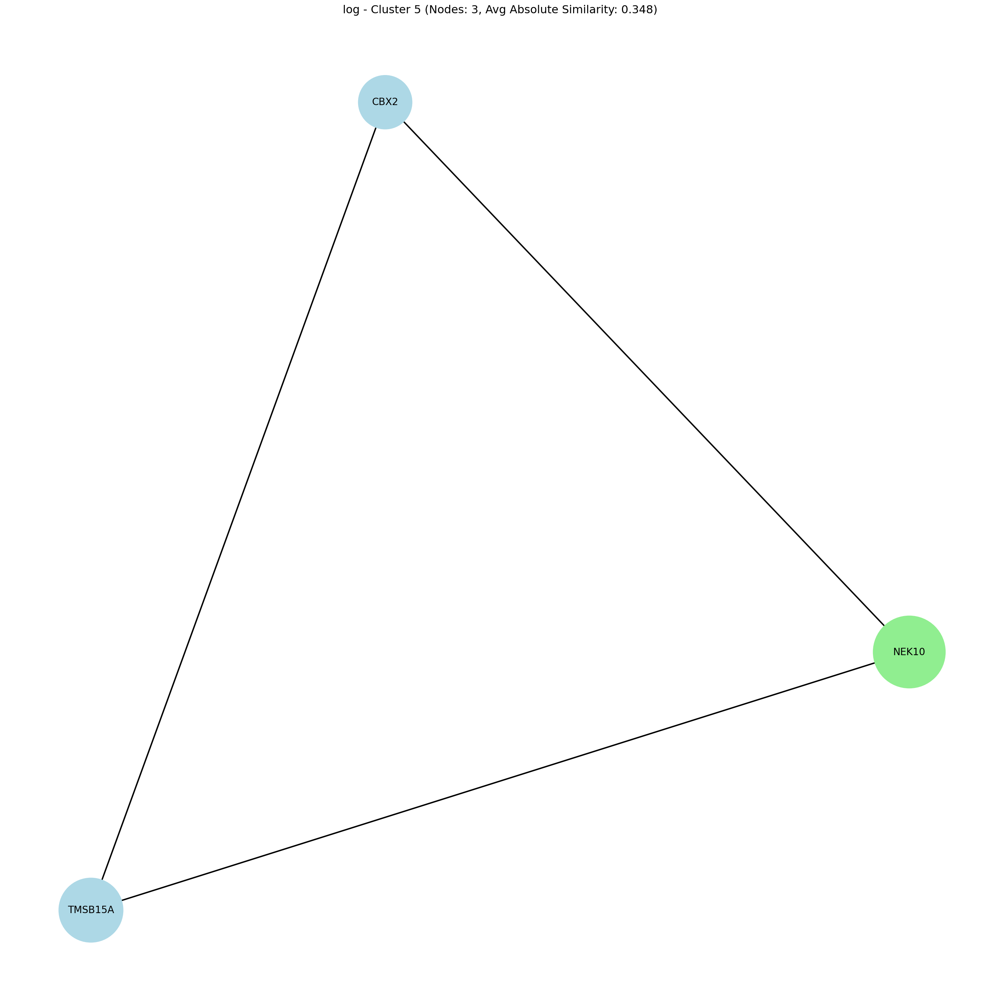

Saved: ./results/plots/log_cluster_3_AvgSimilarity_0.091.png


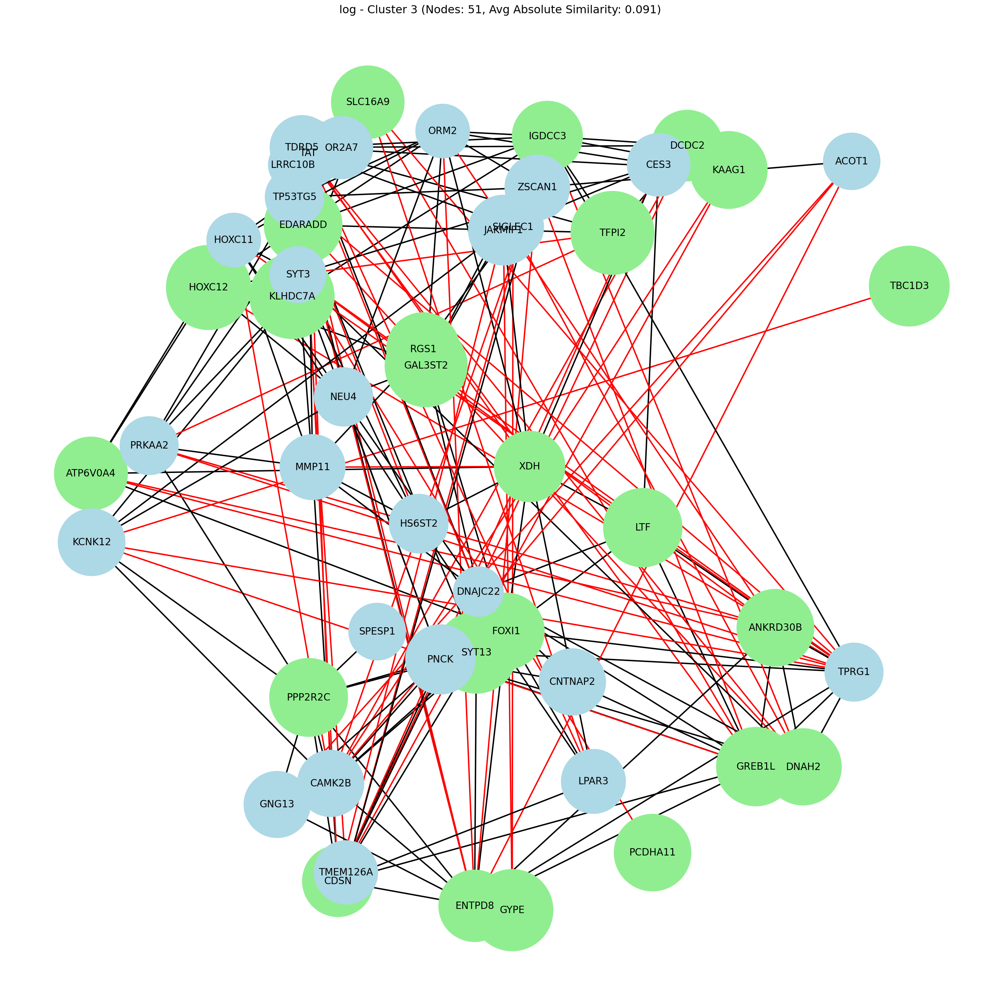

In [58]:
functions.plot_individual_clusters(log_corr, log_clusters_abs, 'log', log_importances, 44, 
                         K_space=None, min_node_count=10, save='./results/plots/')

Saved: ./results/plots/mlp_cluster_8_AvgSimilarity_0.796.png


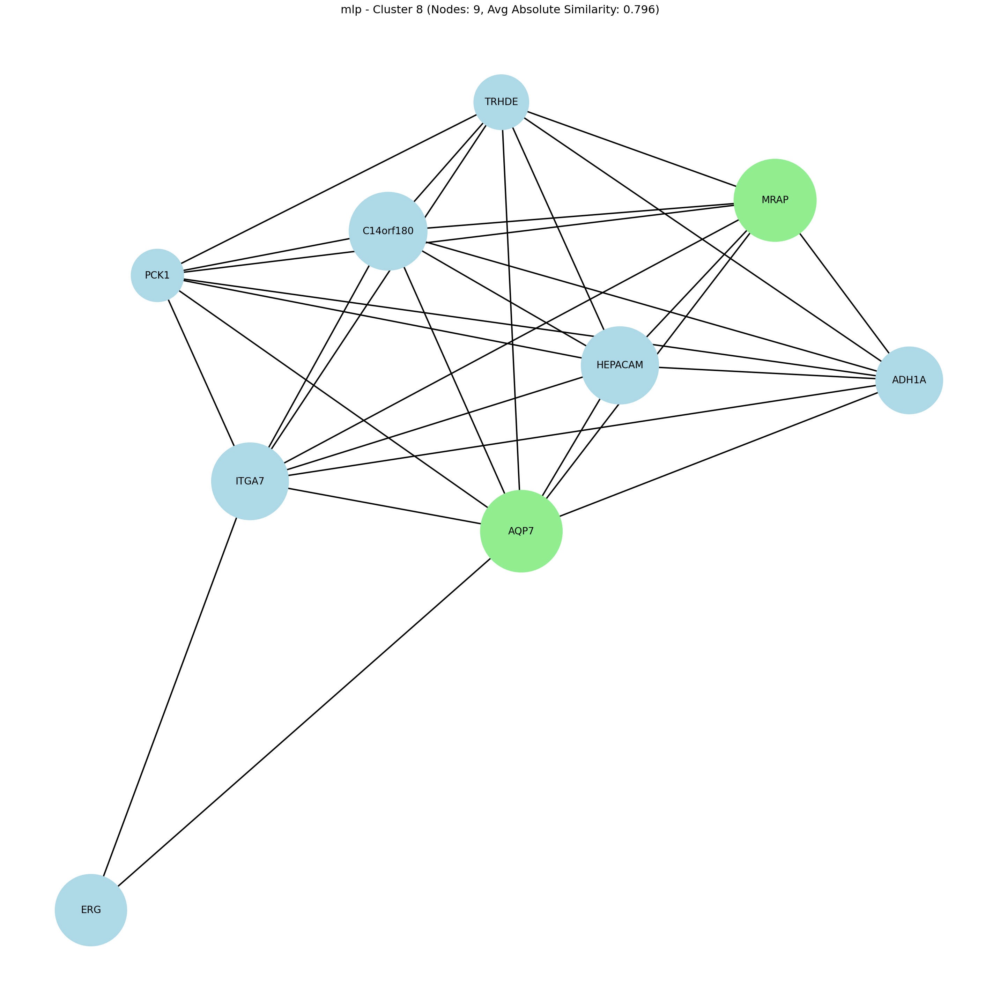

Saved: ./results/plots/mlp_cluster_7_AvgSimilarity_0.736.png


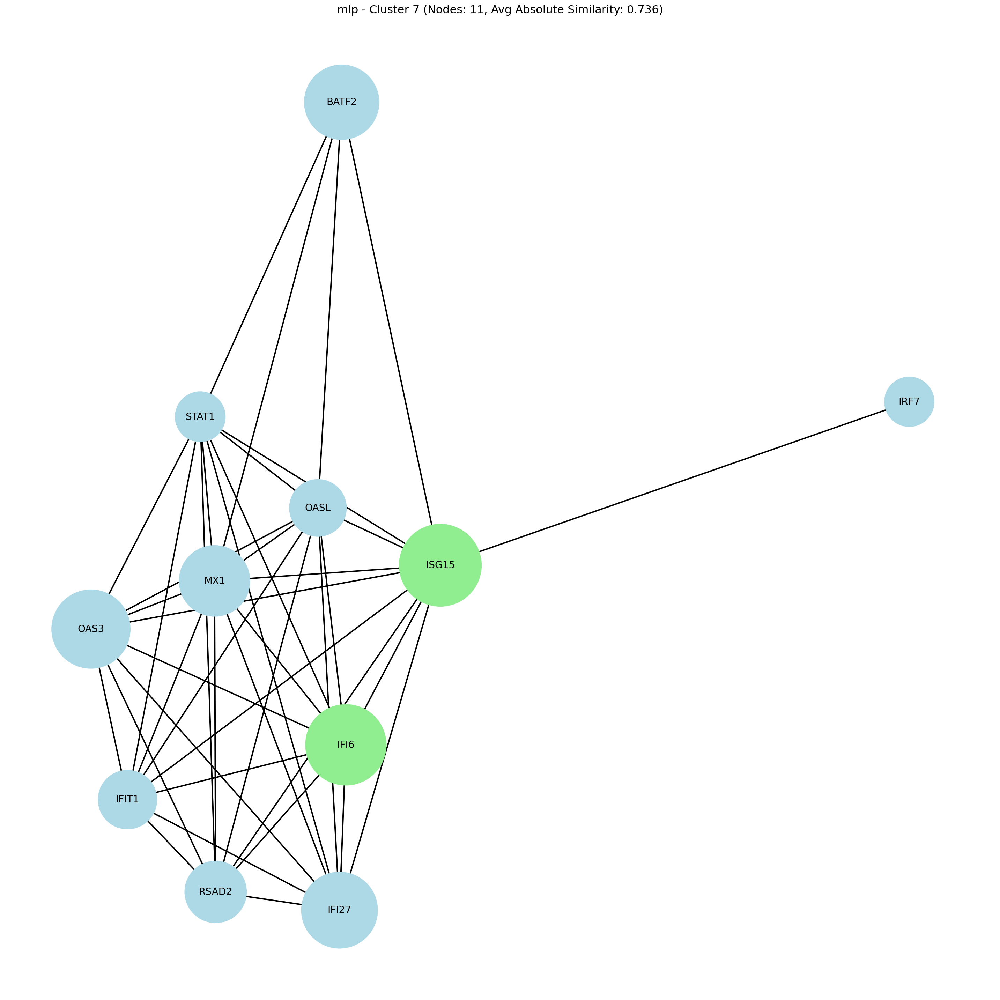

Saved: ./results/plots/mlp_cluster_5_AvgSimilarity_0.716.png


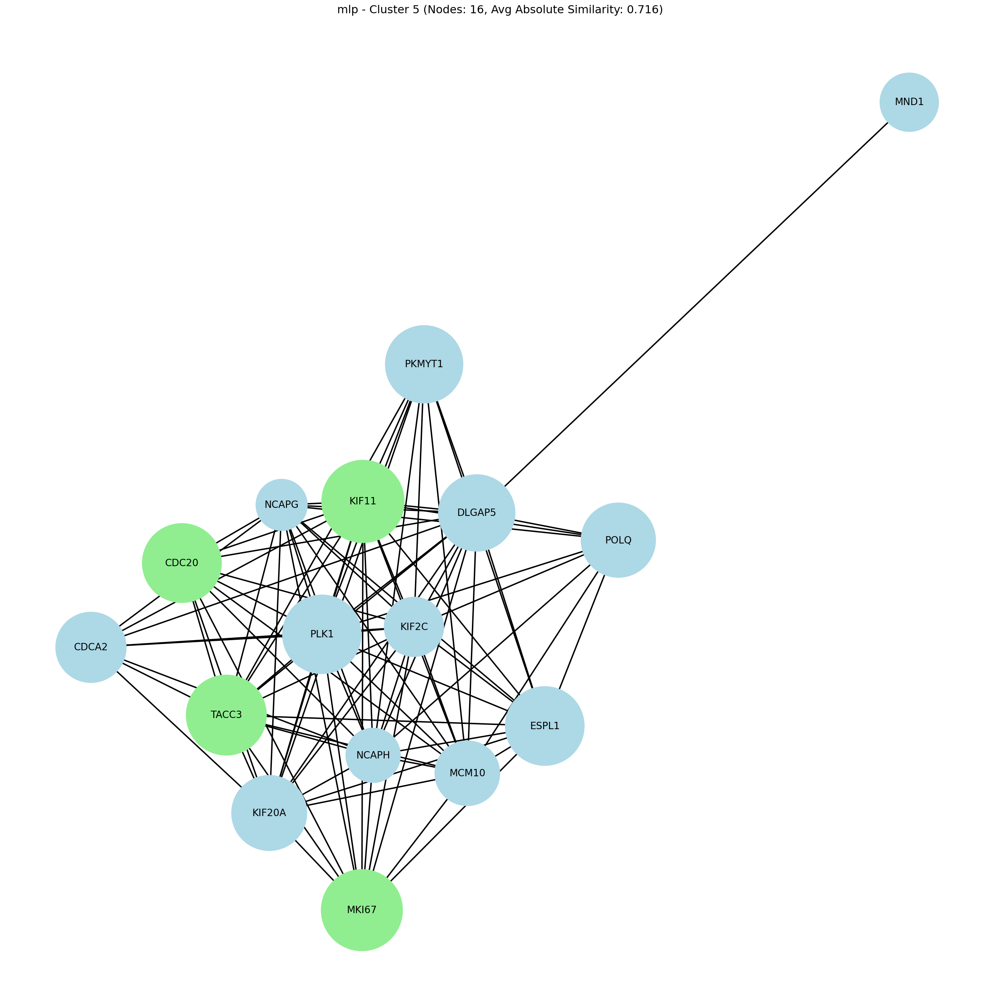

Saved: ./results/plots/mlp_cluster_6_AvgSimilarity_0.633.png


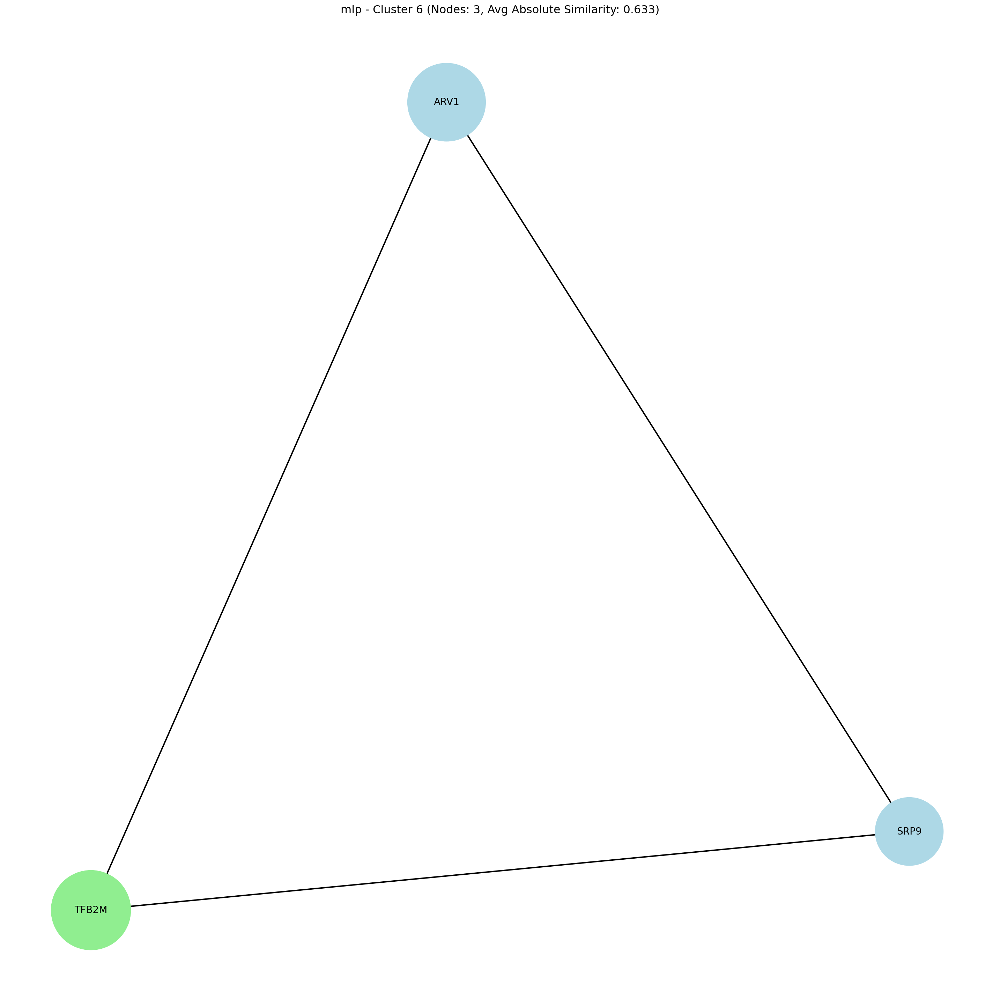

Saved: ./results/plots/mlp_cluster_9_AvgSimilarity_0.426.png


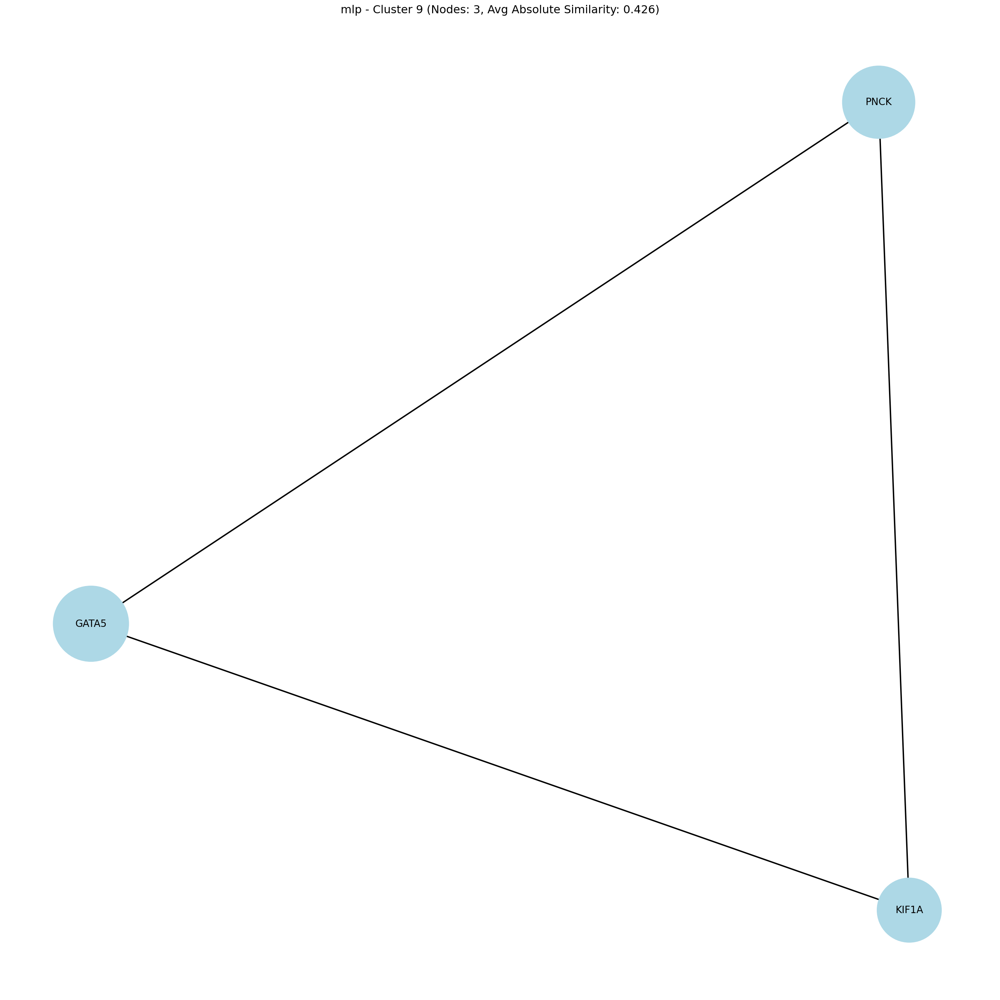

Saved: ./results/plots/mlp_cluster_4_AvgSimilarity_0.291.png


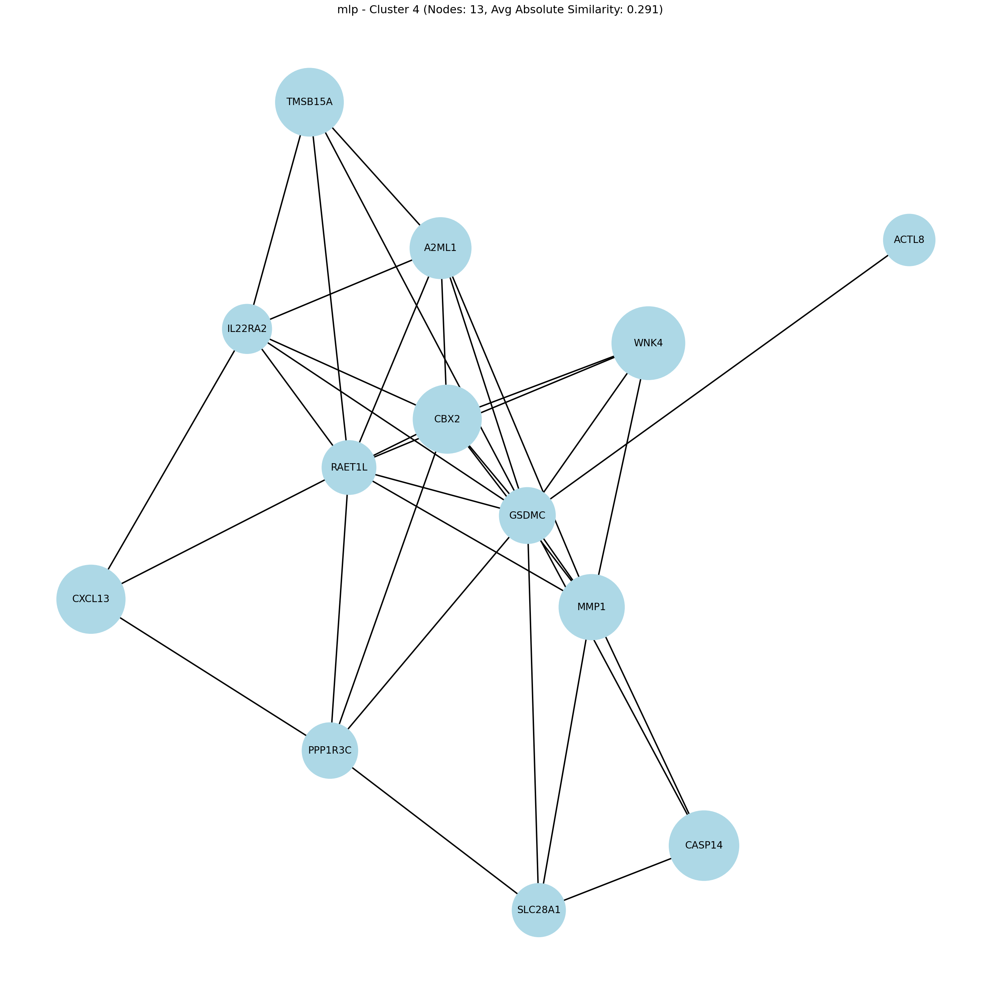

Saved: ./results/plots/mlp_cluster_3_AvgSimilarity_0.266.png


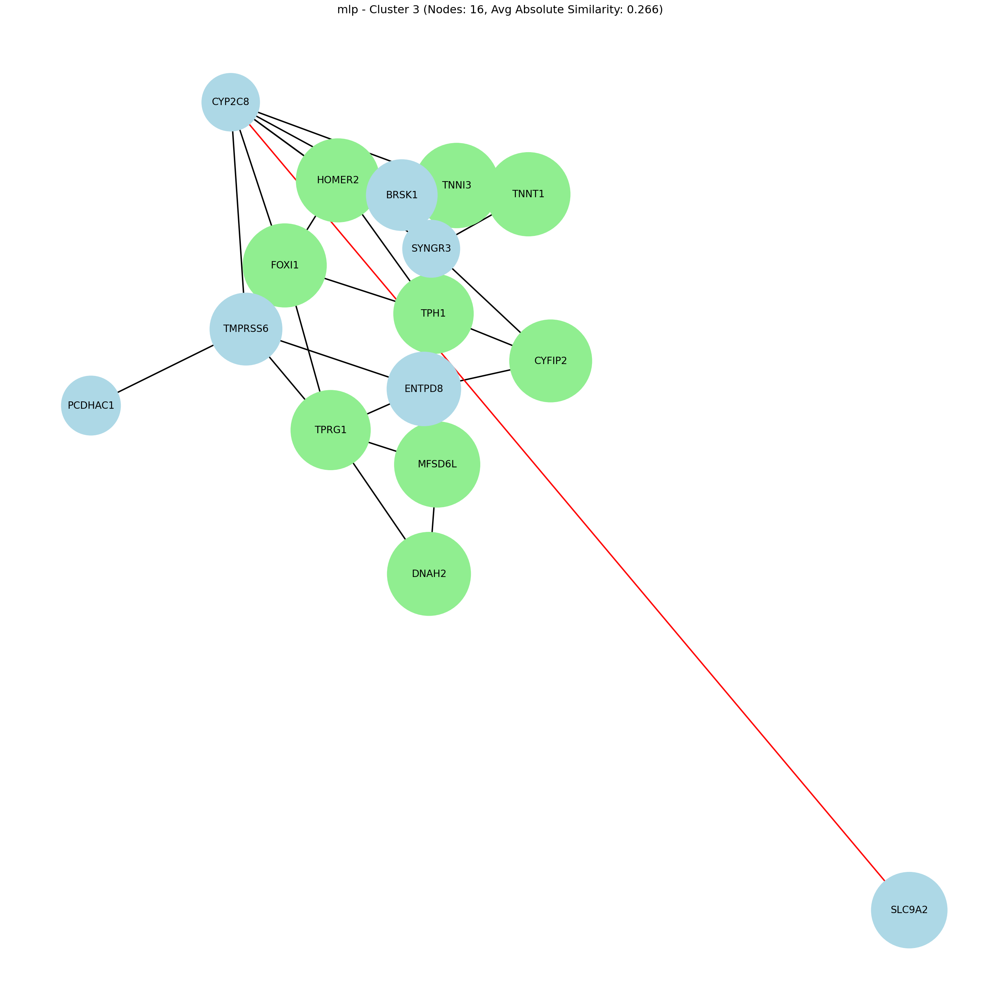

Saved: ./results/plots/mlp_cluster_2_AvgSimilarity_0.186.png


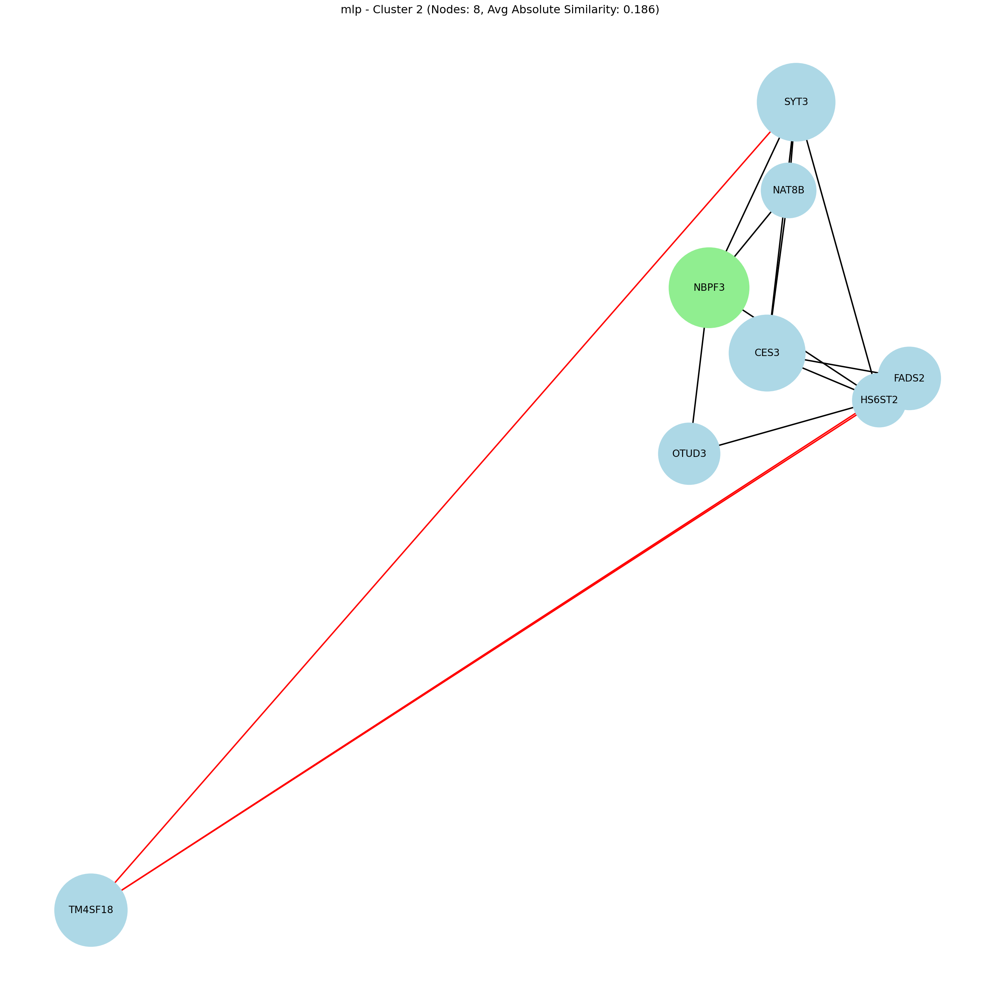

Saved: ./results/plots/mlp_cluster_1_AvgSimilarity_0.121.png


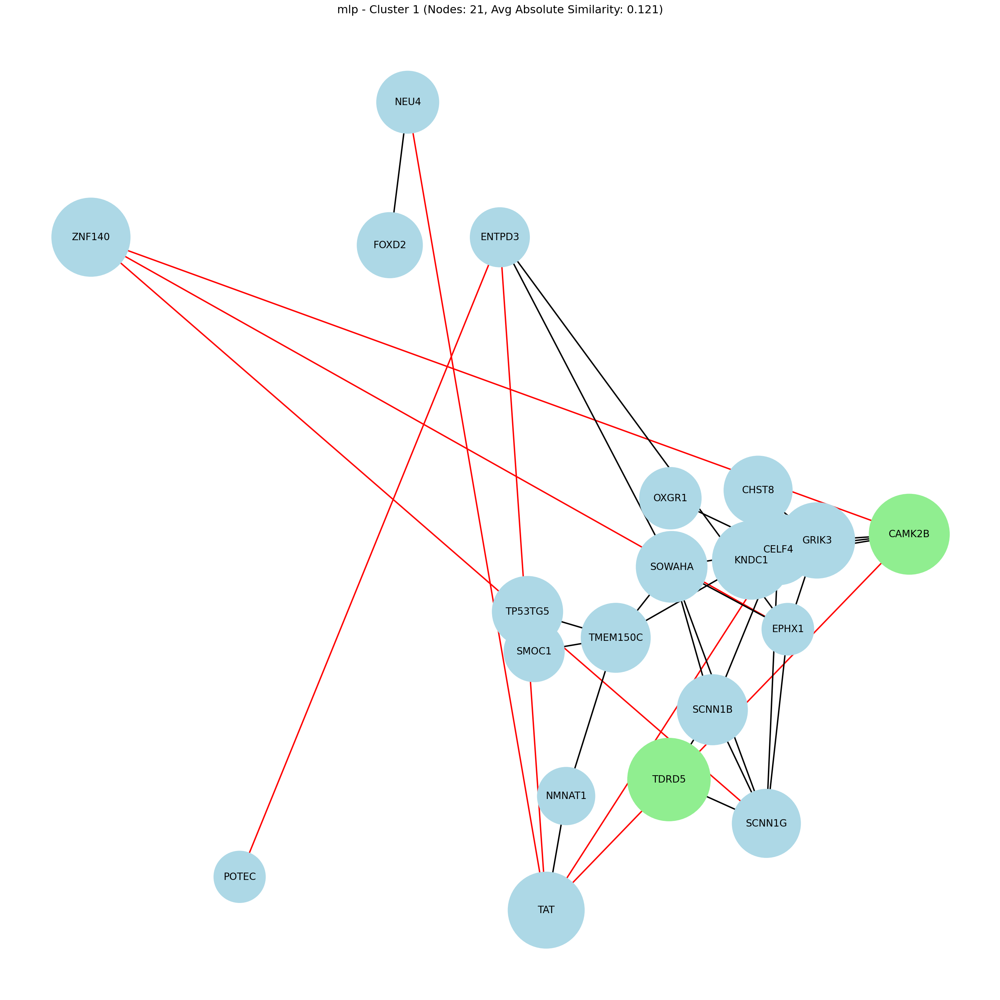

In [59]:
functions.plot_individual_clusters(mlp_corr, mlp_clusters_abs, 'mlp', mlp_importances, 21, 
                         K_space=None, min_node_count=10, save='./results/plots/')

Saved: ./results/plots/cnn_cluster_6_AvgSimilarity_0.526.png


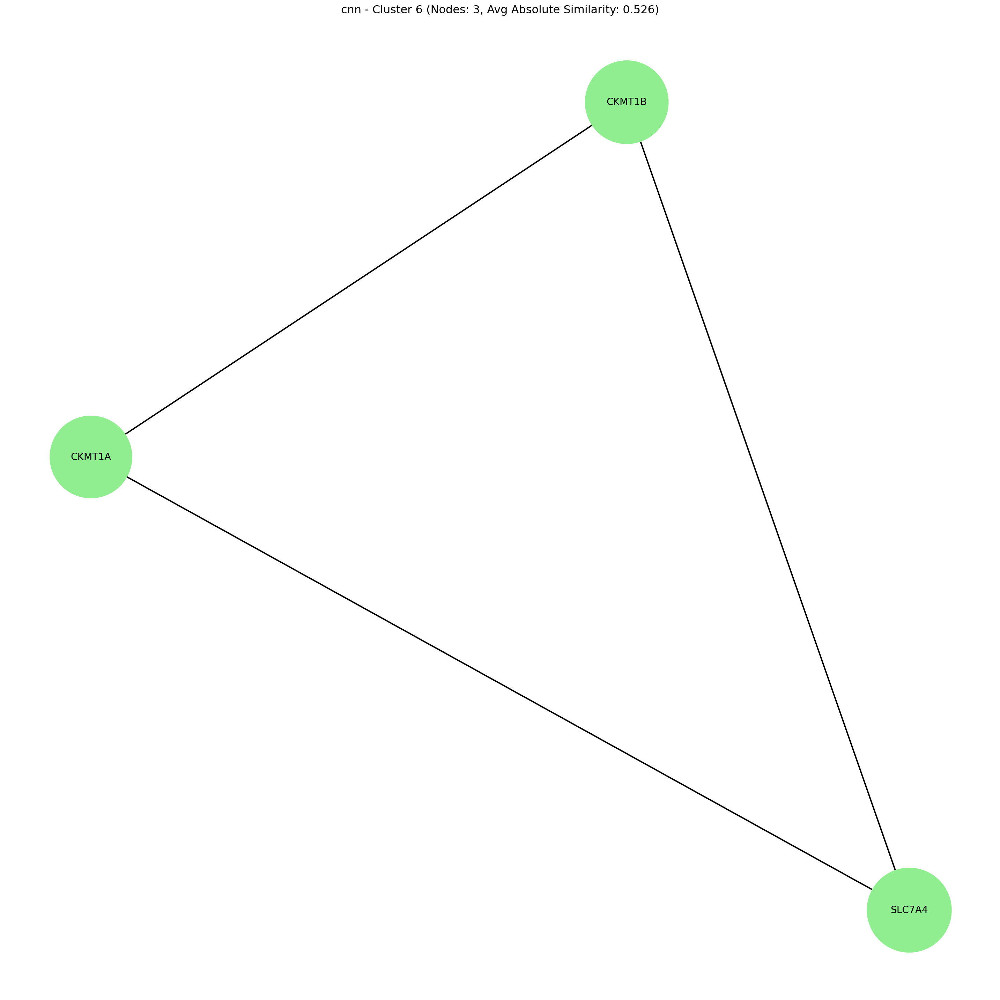

Saved: ./results/plots/cnn_cluster_8_AvgSimilarity_0.462.png


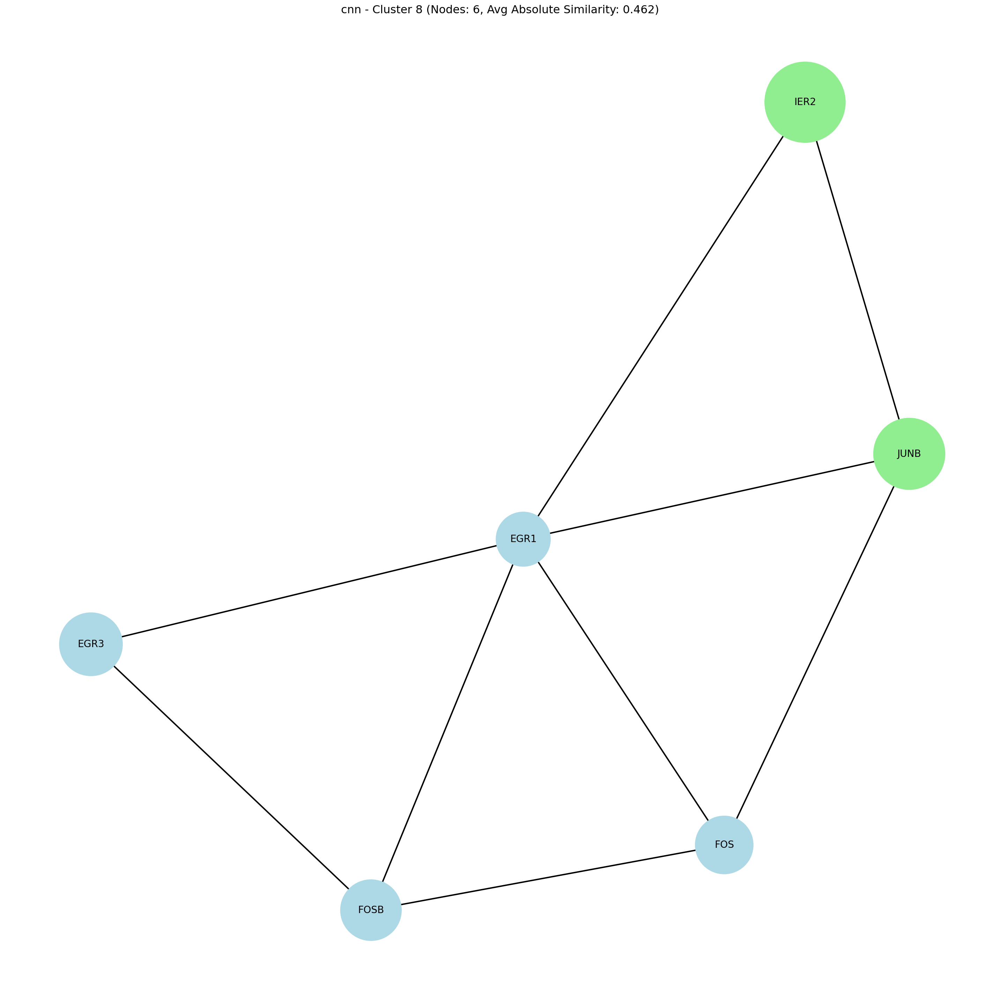

Saved: ./results/plots/cnn_cluster_10_AvgSimilarity_0.405.png


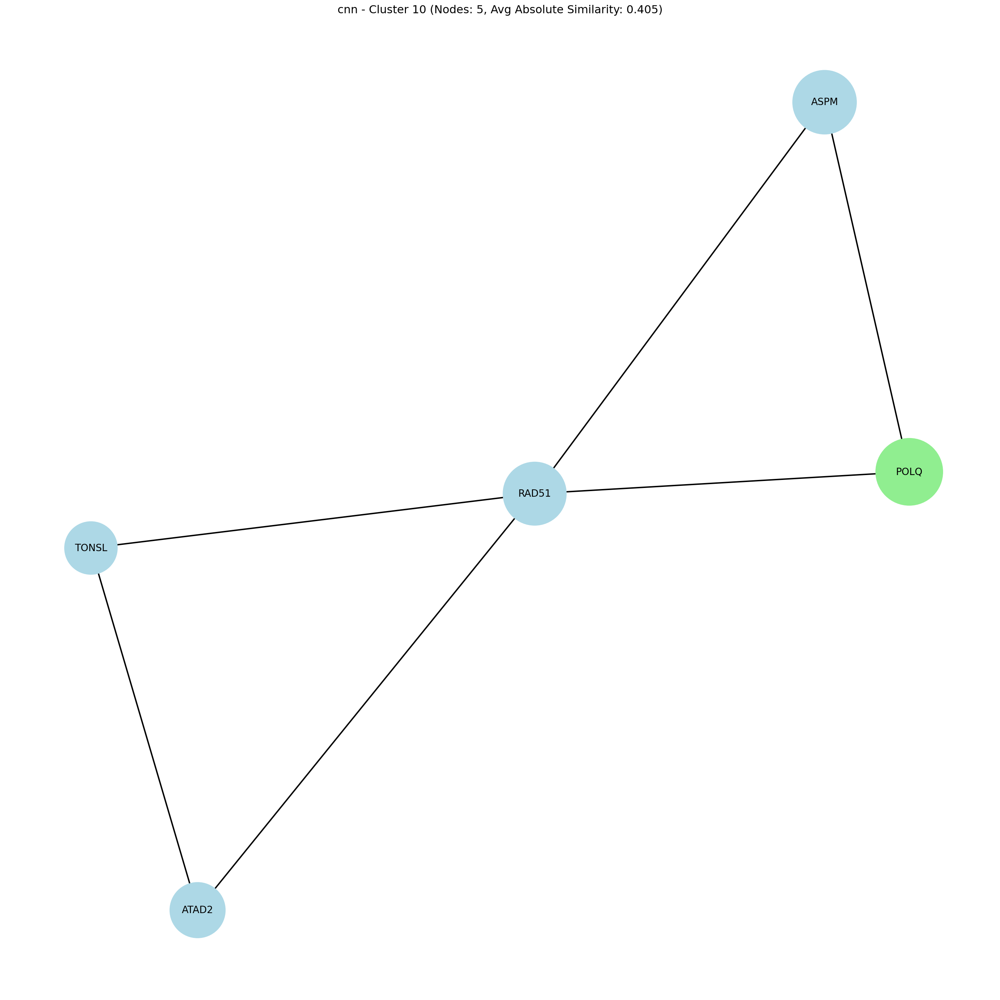

Saved: ./results/plots/cnn_cluster_7_AvgSimilarity_0.242.png


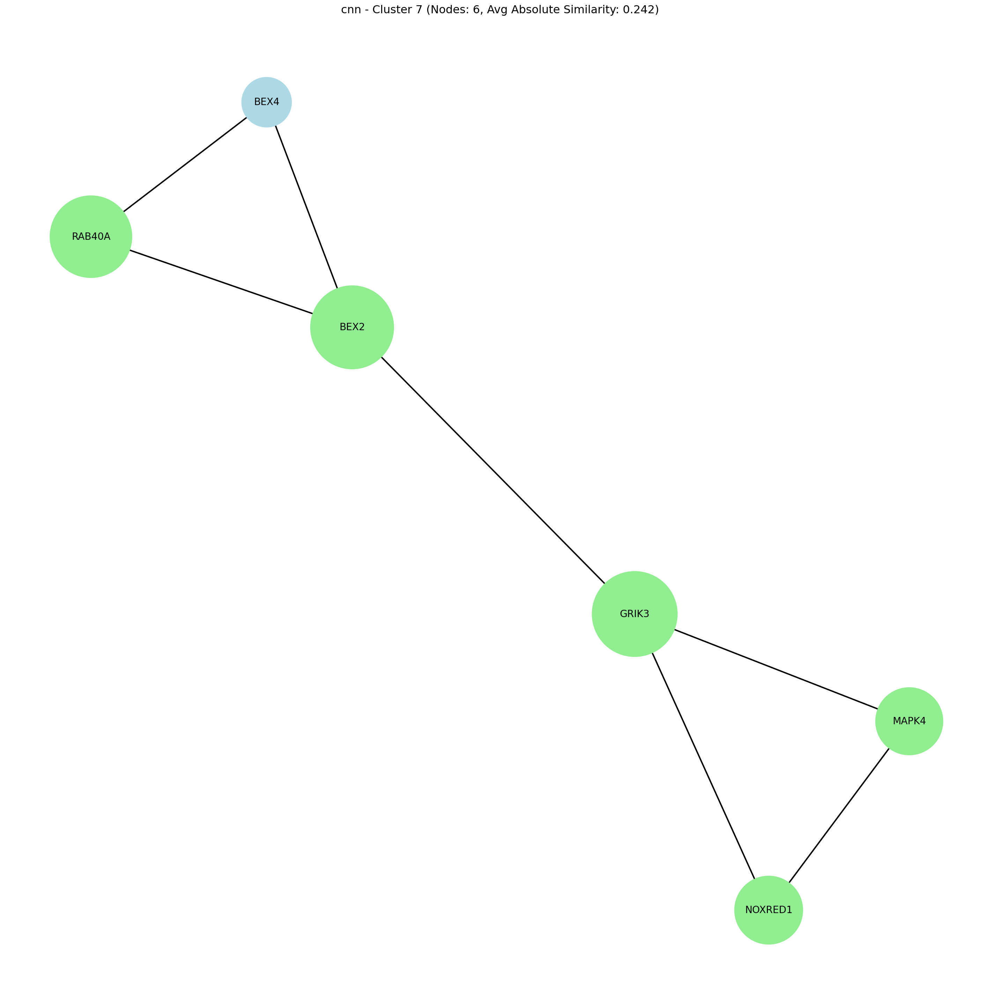

Saved: ./results/plots/cnn_cluster_9_AvgSimilarity_0.233.png


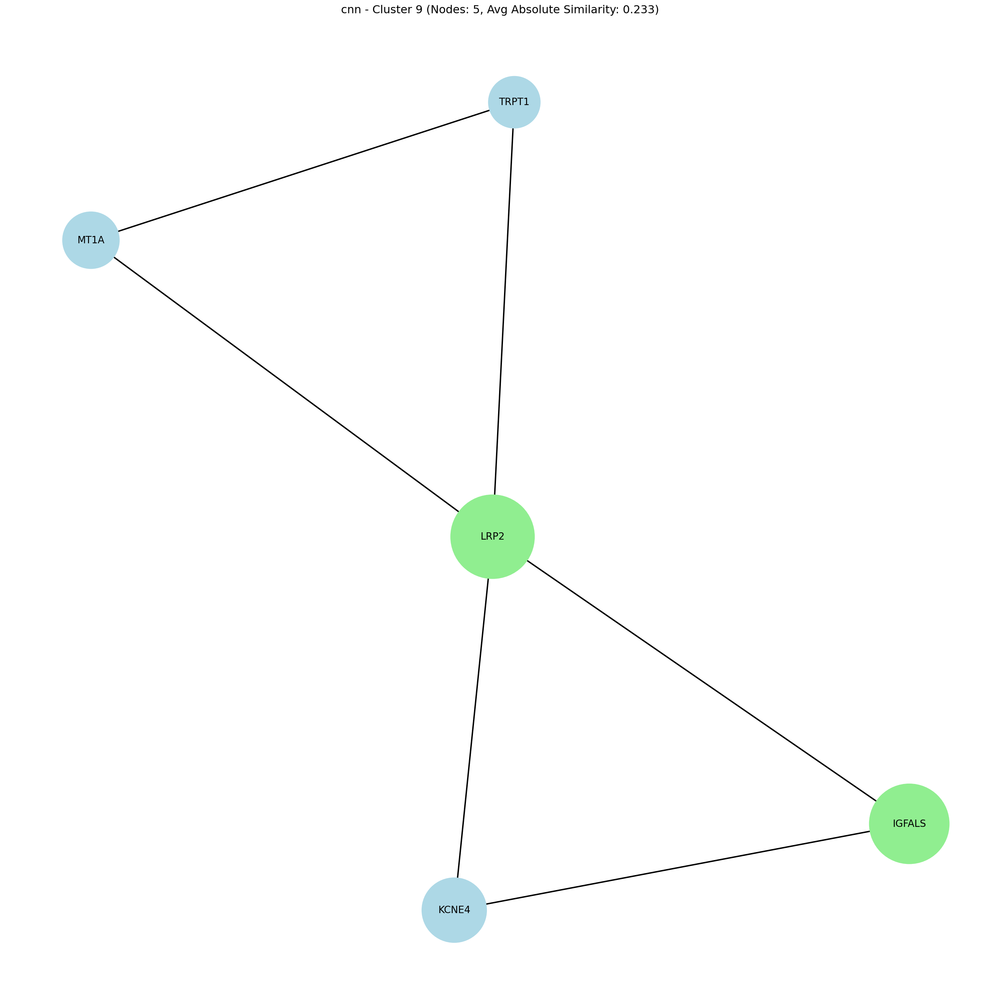

Saved: ./results/plots/cnn_cluster_4_AvgSimilarity_0.154.png


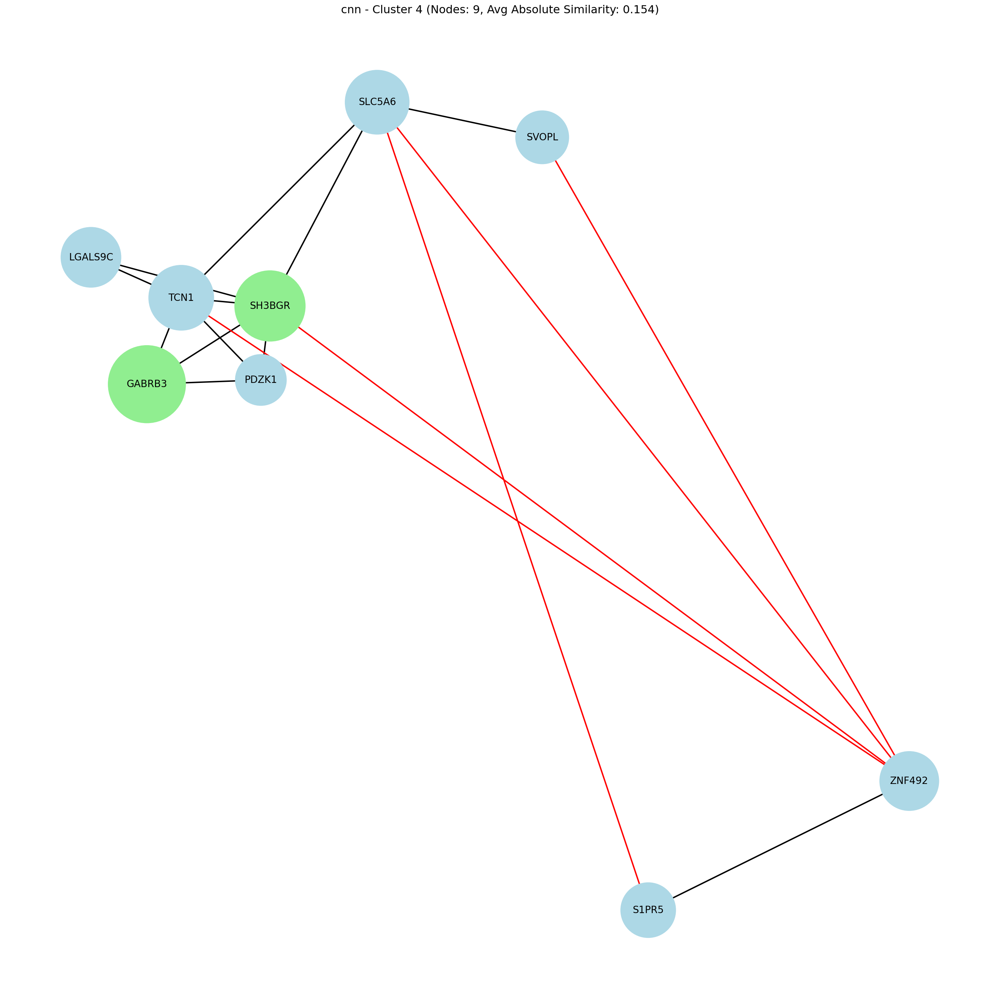

Saved: ./results/plots/cnn_cluster_3_AvgSimilarity_0.122.png


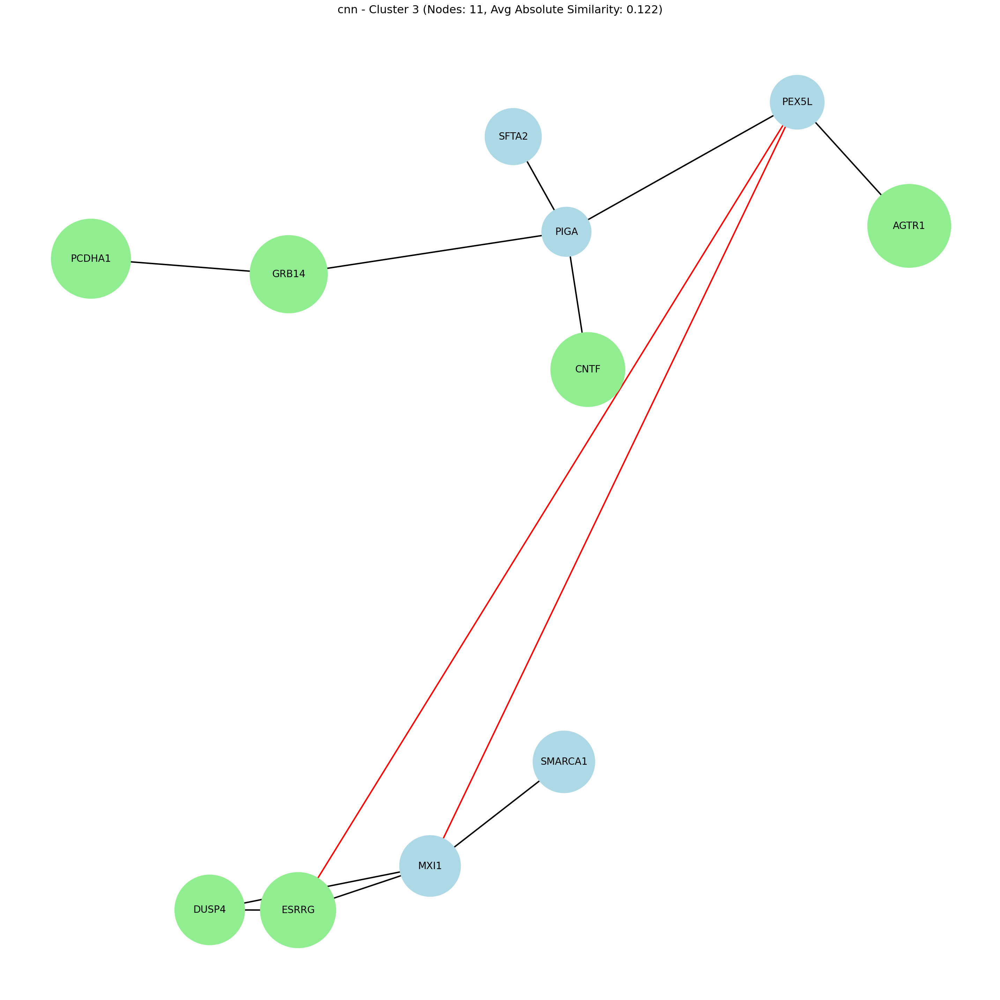

Saved: ./results/plots/cnn_cluster_5_AvgSimilarity_0.109.png


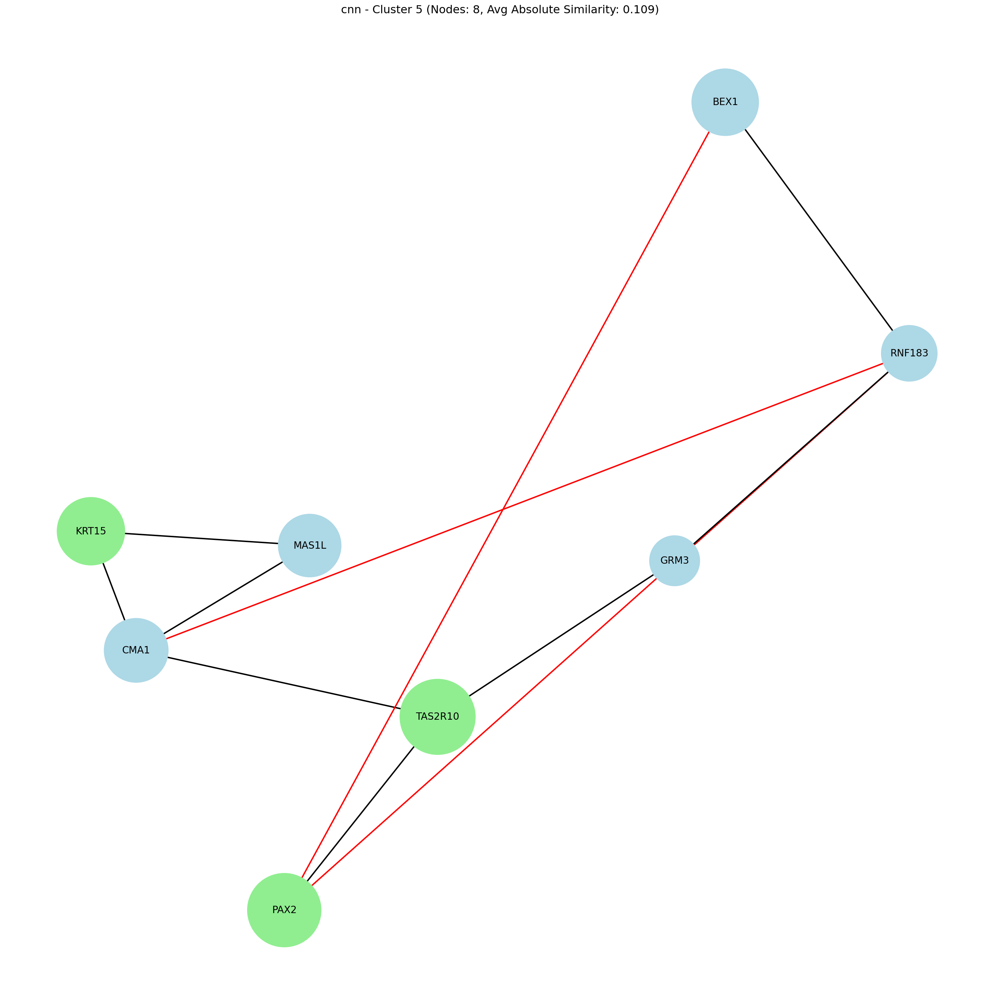

Saved: ./results/plots/cnn_cluster_1_AvgSimilarity_0.096.png


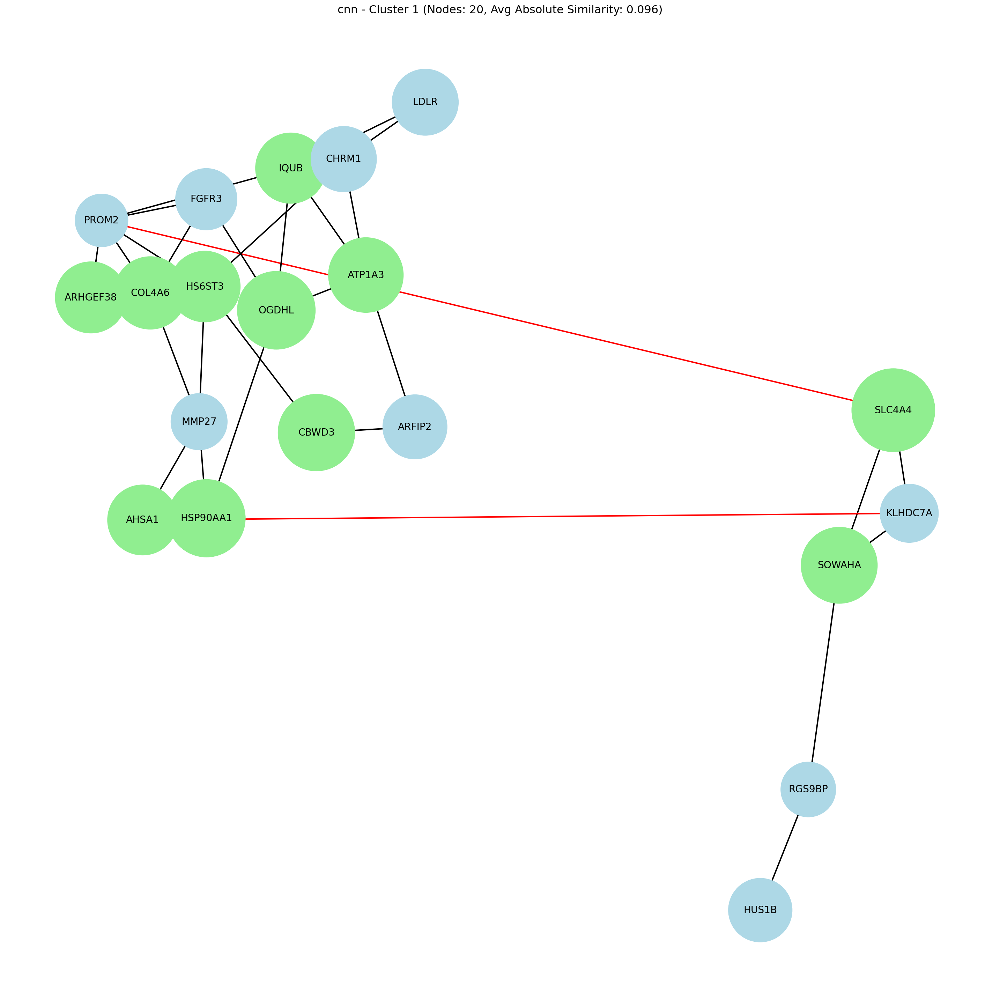

Saved: ./results/plots/cnn_cluster_2_AvgSimilarity_0.087.png


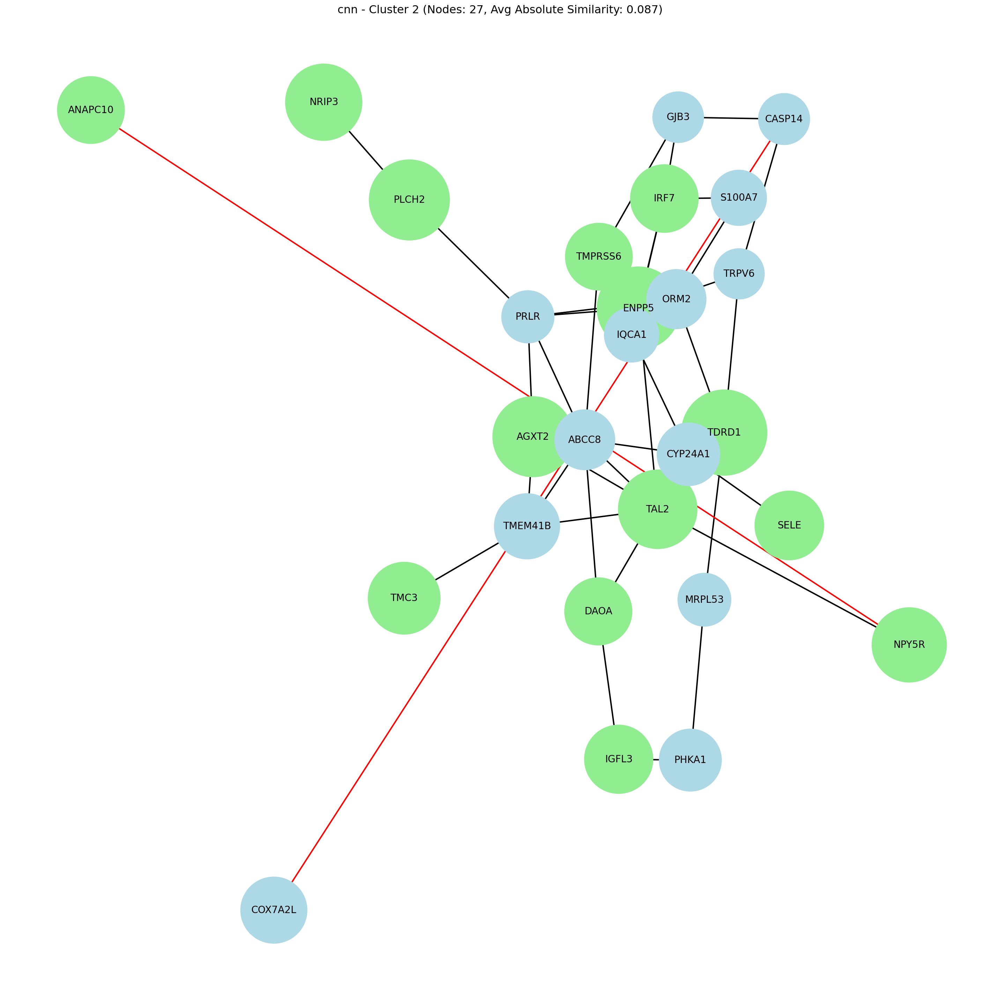

In [60]:
functions.plot_individual_clusters(cnn_corr, cnn_clusters_abs, 'cnn', cnn_importances, 49, 
                         K_space=None, min_node_count=10, save='./results/plots/')